In [1]:
$pip install jupyter

SyntaxError: invalid syntax (<ipython-input-1-1d089836fe61>, line 1)

In [3]:
pip install plotly==4.12.0

     |████████████████████████████████| 13.1 MB 6.2 MB/s eta 0:00:01
  Attempting uninstall: plotly
    Found existing installation: plotly 4.9.0
    Uninstalling plotly-4.9.0:
      Successfully uninstalled plotly-4.9.0
Note: you may need to restart the kernel to use updated packages.


In [7]:

!jupyter labextension install jupyterlab-plotly@4.12.0

Building jupyterlab assets (build:prod:minimize)


In [8]:
!jupyter labextension install @jupyter-widgets/jupyterlab-manager plotlywidget@4.12.0

Building jupyterlab assets (build:prod:minimize)


# Imports
---

In [431]:
import pandas as pd
import numpy as np
import plotly.express as px

In [441]:
df = pd.read_excel("./Datasets/PoliceShooting.xlsx")


In [10]:
df.dtypes

Victim's name                                                                                                                                                                         object
Victim's age                                                                                                                                                                          object
Victim's gender                                                                                                                                                                       object
Victim's race                                                                                                                                                                         object
URL of image of victim                                                                                                                                                                object
Date of Incident (month/day/year)                      

In [11]:
df.columns

Index(['Victim's name', 'Victim's age', 'Victim's gender', 'Victim's race',
       'URL of image of victim', 'Date of Incident (month/day/year)',
       'Street Address of Incident', 'City', 'State', 'Zipcode', 'County',
       'Agency responsible for death', 'ORI Agency Identifier (if available)',
       'Cause of death',
       'A brief description of the circumstances surrounding the death',
       'Official disposition of death (justified or other)',
       'Criminal Charges?',
       'Link to news article or photo of official document',
       'Symptoms of mental illness?', 'Unarmed/Did Not Have an Actual Weapon',
       'Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database)',
       'Alleged Threat Level (Source: WaPo)', 'Fleeing (Source: WaPo)',
       'Body Camera (Source: WaPo)', 'WaPo ID (If included in WaPo database)',
       'Off-Duty Killing?',
       'Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-co

In [45]:
def change_names_of_columns(df):
    df["Victim's age"].replace("Unknown", np.nan)
    df['Victim\'s age'] = pd.to_numeric(df['Victim\'s age'])

In [46]:
df[df['Victim\'s age'] == 'Unknown']['Victim\'s age'].replace("Unknown", np.nan)

112    NaN
122    NaN
131    NaN
140    NaN
143    NaN
        ..
8100   NaN
8147   NaN
8158   NaN
8205   NaN
8473   NaN
Name: Victim's age, Length: 268, dtype: float64

In [62]:
df["Victim's age"].replace("Unknown", np.nan)

0       NaN
1        46
2        43
3        37
4        32
       ... 
8515     21
8516     26
8517     49
8518     21
8519     26
Name: Victim's age, Length: 8520, dtype: object

In [63]:
df[df['Victim\'s age'] == "Unknown"]

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,...,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID
112,Kurt Phelps,Unknown,Male,Unknown race,NaN,2020-08-29,1200 M 3/4 Road,Loma,CO,81524.0,...,Allegedly Armed,gun,other,Not fleeing,No,6118.0,NaN,Rural,8430.0,28697.0
122,Name withheld by police,Unknown,NaN,Unknown race,NaN,2020-08-24,Florence and Beverly Hills Ave NE,Albuquerque,NM,87113.0,...,Allegedly Armed,gun,attack,NaN,No,6109.0,NaN,Urban,8420.0,28657.0
131,Name withheld by police,Unknown,Male,Unknown race,NaN,2020-08-20,15301 Peach Orchard Road,Brooksville,FL,34614.0,...,Allegedly Armed,gun,attack,NaN,No,6102.0,NaN,Rural,8408.0,NaN
140,Erik Jon Perez,Unknown,Male,White,NaN,2020-08-18,NaN,Bay City,TX,77414.0,...,Allegedly Armed,gun,attack,Foot,NaN,NaN,NaN,Rural,8402.0,NaN
143,Everardo Gonzalez Santana,Unknown,Male,Hispanic,NaN,2020-08-17,Brundage Lane and P Street,Bakersfield,CA,93304.0,...,Allegedly Armed,knife,other,Car,No,6096.0,NaN,Urban,8398.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8100,Name withheld by police,Unknown,Male,Unknown race,NaN,2013-05-22,5600 Wyalusing Avenue,Philadelphia,PA,19131.0,...,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Urban,426.0,12824.0
8147,Name withheld by police,Unknown,Male,Unknown race,NaN,2013-05-08,N.W. 59 Street & N.W. 35 Avenue,Miami,FL,33142.0,...,Unclear,undetermined,NaN,NaN,NaN,NaN,NaN,Urban,378.0,12757.0
8158,Name withheld by police,Unknown,Male,Unknown race,NaN,2013-05-04,Northwest 114th Street and 27th Avenue,Miami,FL,33167.0,...,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,367.0,12743.0
8205,Michael Everett Morgan,Unknown,Male,Unknown race,NaN,2013-04-22,1170 W. State Road 434,Longwood,FL,32750.0,...,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,317.0,12681.0


In [65]:
df2 = pd.read_excel("./Datasets/PoliceShooting.xlsx", "2013-2019 Killings by State")
df2

,State,State Abbreviation,Total Population,Black Population,Hispanic Population,Native American Population,Asian Population,Pacific Islander Population,White Population,Other Population,...,Rate (Hispanic People),Rate (Native American People),Rate (Asian People),Rate (Pacific Islanders),Rate (White People),Rate (All People),Disparity in Rate,Black-White Disparity,Hispanic-White Disparity,Native American-White Disparity
0,Alabama,AL,4864680.0,1285737.0,203146.0,23243.0,63936.0,1521.0,3196730.0,90367.0,...,0.000000,0.000000,2.234377,0.000000,3.306951,4.052535,1.453111,1.780730,0.000000,0.000000
1,Alaska,AK,738516.0,22817.0,51186.0,103506.0,45617.0,8544.0,450754.0,56092.0,...,2.790942,16.562187,0.000000,0.000000,5.704727,7.737525,3.236692,4.390041,0.489233,2.903239
2,Arizona,AZ,6946685.0,286614.0,2163312.0,271946.0,222477.0,12523.0,3825886.0,163927.0,...,7.594176,7.354401,0.000000,0.000000,5.302227,7.012595,2.203370,2.914124,1.432262,1.387040
3,Arkansas,AR,2990671.0,458536.0,219052.0,17342.0,43441.0,7877.0,2173849.0,70574.0,...,1.956483,0.000000,3.288533,0.000000,3.942973,4.967829,1.944122,2.449438,0.496195,0.000000
4,California,CA,39148760.0,2164519.0,15221577.0,138427.0,5525439.0,138911.0,14695836.0,1264051.0,...,4.570580,7.224024,1.137595,9.255669,3.275952,4.302271,2.868695,3.767425,1.395191,2.205168
5,Colorado,CO,5531141.0,216732.0,1184794.0,30131.0,169556.0,7480.0,3778212.0,144236.0,...,8.440286,23.706008,3.370147,0.000000,3.894510,5.862908,2.473367,3.723478,2.167226,6.087032
6,Connecticut,CT,3581504.0,351817.0,561791.0,5320.0,157406.0,752.0,2418696.0,85722.0,...,1.525733,0.000000,0.907571,0.000000,1.122210,1.435949,1.979448,2.532847,1.359578,0.000000
7,Delaware,DE,949495.0,204665.0,86315.0,2851.0,36464.0,276.0,595623.0,23301.0,...,0.000000,0.000000,0.000000,0.000000,1.918759,3.009118,2.087669,3.274013,0.000000,0.000000
8,District of Columbia,DC,684498.0,315281.0,74776.0,1314.0,26278.0,280.0,248057.0,18512.0,...,0.000000,0.000000,0.000000,0.000000,0.575905,5.426292,1.920564,18.095956,0.000000,0.000000
9,Florida,FL,20598139.0,3167011.0,5184720.0,41776.0,548642.0,10770.0,11196857.0,448363.0,...,2.094065,0.000000,1.562299,0.000000,3.113119,3.738202,2.039278,2.448744,0.672658,0.000000


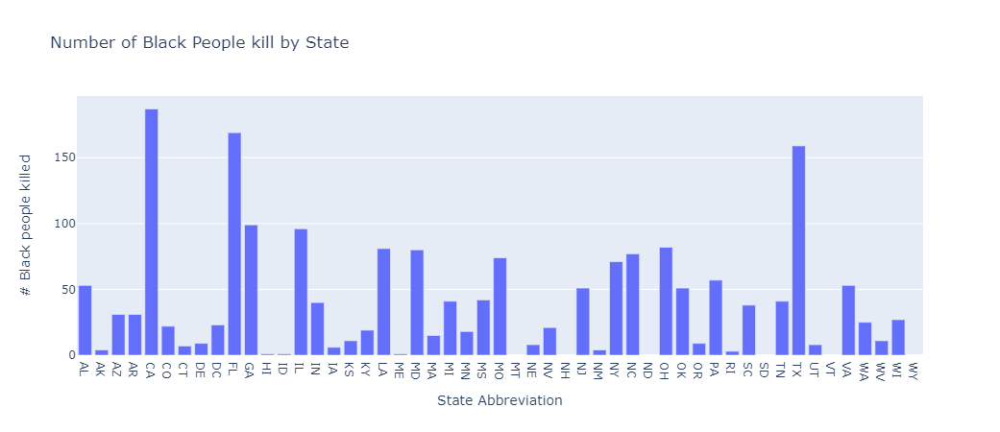

In [67]:
import plotly.express as px

fig = px.bar(df2, x="State Abbreviation", y="# Black people killed", title="Number of Black People kill by State")
fig.show()

In [72]:
pd.set_option('display.max_rows', 20)

In [73]:
df2

,State,State Abbreviation,Total Population,Black Population,Hispanic Population,Native American Population,Asian Population,Pacific Islander Population,White Population,Other Population,% African-American,% Victims Black,Disparity,# Black people killed,# Hispanic people killed,# Native American people killed,# Asian people killed,# Pacific Islanders killed,# White people killed,# Unknown Race people killed,# People Killed,Rate (Black People),Rate (Hispanic People),Rate (Native American People),Rate (Asian People),Rate (Pacific Islanders),Rate (White People),Rate (All People),Disparity in Rate,Black-White Disparity,Hispanic-White Disparity,Native American-White Disparity
0,Alabama,AL,4864680.0,1285737.0,203146.0,23243.0,63936.0,1521.0,3196730.0,90367.0,0.264300,0.384058,0.119758,53.0,NaN,NaN,1.0,NaN,74.0,10.0,138.0,5.888785,0.000000,0.000000,2.234377,0.000000,3.306951,4.052535,1.453111,1.780730,0.000000,0.000000
1,Alaska,AK,738516.0,22817.0,51186.0,103506.0,45617.0,8544.0,450754.0,56092.0,0.030896,0.100000,0.069104,4.0,1.0,12.0,NaN,NaN,18.0,5.0,40.0,25.043983,2.790942,16.562187,0.000000,0.000000,5.704727,7.737525,3.236692,4.390041,0.489233,2.903239
2,Arizona,AZ,6946685.0,286614.0,2163312.0,271946.0,222477.0,12523.0,3825886.0,163927.0,0.041259,0.090909,0.049650,31.0,115.0,14.0,NaN,NaN,142.0,39.0,341.0,15.451344,7.594176,7.354401,0.000000,0.000000,5.302227,7.012595,2.203370,2.914124,1.432262,1.387040
3,Arkansas,AR,2990671.0,458536.0,219052.0,17342.0,43441.0,7877.0,2173849.0,70574.0,0.153322,0.298077,0.144755,31.0,3.0,NaN,1.0,NaN,60.0,9.0,104.0,9.658067,1.956483,0.000000,3.288533,0.000000,3.942973,4.967829,1.944122,2.449438,0.496195,0.000000
4,California,CA,39148760.0,2164519.0,15221577.0,138427.0,5525439.0,138911.0,14695836.0,1264051.0,0.055290,0.158609,0.103319,187.0,487.0,7.0,44.0,9.0,337.0,108.0,1179.0,12.341904,4.570580,7.224024,1.137595,9.255669,3.275952,4.302271,2.868695,3.767425,1.395191,2.205168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48,West Virginia,WV,1829054.0,65597.0,27522.0,3546.0,14353.0,309.0,1684756.0,32971.0,0.035864,0.148649,0.112785,11.0,NaN,NaN,1.0,NaN,51.0,11.0,74.0,23.955799,0.000000,0.000000,9.953121,0.000000,4.324492,5.779725,4.144799,5.539563,0.000000,0.000000
49,Wisconsin,WI,5778394.0,361909.0,385779.0,46149.0,158198.0,1676.0,4711038.0,113645.0,0.062631,0.243243,0.180612,27.0,8.0,5.0,4.0,NaN,63.0,4.0,111.0,10.657770,2.962466,15.477816,3.612110,0.000000,1.910407,2.744213,3.883726,5.578795,1.550699,8.101842
50,Wyoming,WY,581836.0,5149.0,56966.0,12717.0,4660.0,434.0,489559.0,12351.0,0.008850,0.000000,-0.008850,NaN,2.0,2.0,NaN,NaN,12.0,3.0,19.0,0.000000,5.015523,22.467114,0.000000,0.000000,3.501694,4.665036,0.000000,0.000000,1.432313,6.416070
51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [77]:
df2_show = df2.sort_values(by=["# People Killed"], ascending=False)

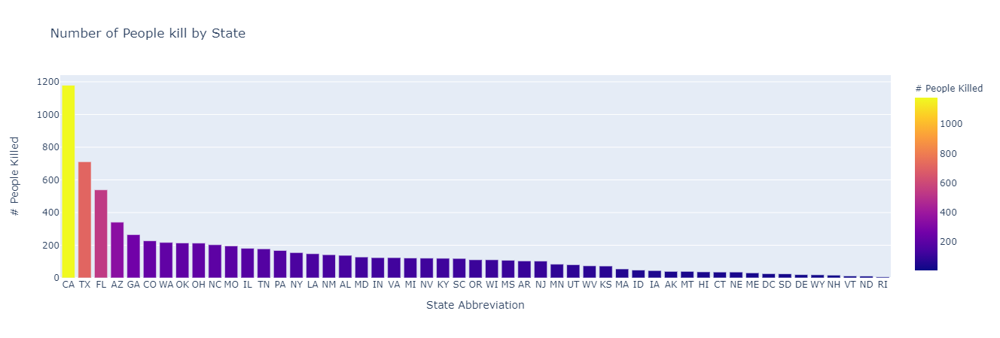

In [134]:
import plotly.express as px

fig = px.bar(df2_show, x="State Abbreviation", y="# People Killed", title="Number of People kill by State", color= "# People Killed")
fig.show()

In [170]:
states = "CA, TX, GA, SC, WA"

In [171]:
def state_selection(states:str):
    x = states.split(", ")
    for states in x:
        states.strip()
    return x

In [164]:
state_selection(states)

['CA', 'TX', 'GA', 'SC', 'WA']

In [165]:
df2_show2 = df2_show.loc[df2_show["State Abbreviation"].isin(state_selection(states))].copy()

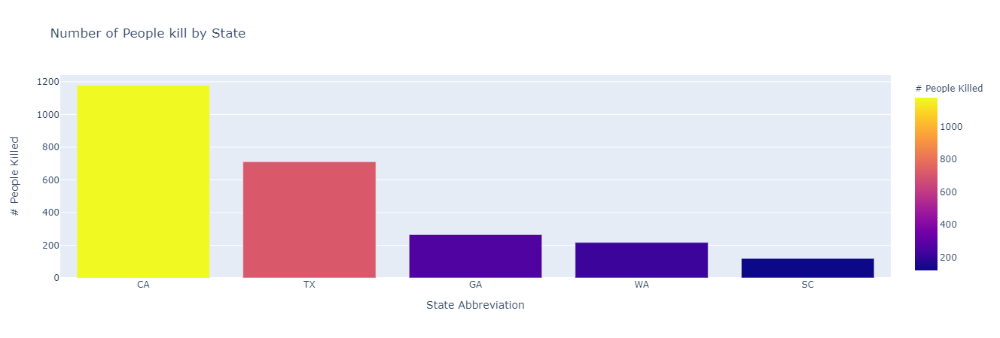

In [166]:
import plotly.express as px

fig = px.bar(df2_show2, x="State Abbreviation", y="# People Killed", title="Number of People kill by State", color= "# People Killed")
fig.show()

In [167]:
df['Date of Incident (month/day/year)'] == 2020-10-19

0       False
1       False
2       False
3       False
4       False
        ...  
8515    False
8516    False
8517    False
8518    False
8519    False
Name: Date of Incident (month/day/year), Length: 8520, dtype: bool

In [151]:
mask = ("11-24-2020" < df['Date of Incident (month/day/year)'] > '01-01-2020')

In [153]:
df_show2 = df.loc[mask].copy()

In [169]:
df_show2.groupby(["State"])

In [173]:
mask = (df['Zipcode'].isin(zcode))

In [172]:
zcode = [77414.0, 34614.0]
    

In [174]:
df_show3 = df.loc[mask].copy()

In [177]:
df_show3.nunique()

Victim's name                                                                                                                                                                 2
Victim's age                                                                                                                                                                  1
Victim's gender                                                                                                                                                               1
Victim's race                                                                                                                                                                 2
URL of image of victim                                                                                                                                                        0
                                                                                                                        

In [176]:
import plotly.express as px

fig = px.bar(df_show3, x="Zipcode", y="# People Killed", title="Number of People kill by State", color= "# People Killed")
fig.show()

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID
131,Name withheld by police,Unknown,Male,Unknown race,NaN,2020-08-20,15301 Peach Orchard Road,Brooksville,FL,34614.0,Hernando,Hernando County Sheriff's Office,FL0270000,Gunshot,"Around 9:15 p.m., deputies went to a home to s...",Pending investigation,No known charges,https://www.tampabay.com/news/hernando/2020/08...,No,Allegedly Armed,gun,attack,NaN,No,6102.0,NaN,Rural,8408.0,NaN
140,Erik Jon Perez,Unknown,Male,White,NaN,2020-08-18,NaN,Bay City,TX,77414.0,Matagorda,"Bay City Police Department, Matagorda County S...",TX1610100;TX1610000;TX0000000,Gunshot,Erik Jon Perez was reportedly wanted for felon...,Pending investigation,No known charges,https://www.khou.com/article/news/crime/bay-ci...,No,Allegedly Armed,gun,attack,Foot,NaN,NaN,NaN,Rural,8402.0,NaN


In [192]:
df_show3

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID
131,Name withheld by police,Unknown,Male,Unknown race,NaN,2020-08-20,15301 Peach Orchard Road,Brooksville,FL,34614.0,Hernando,Hernando County Sheriff's Office,FL0270000,Gunshot,"Around 9:15 p.m., deputies went to a home to s...",Pending investigation,No known charges,https://www.tampabay.com/news/hernando/2020/08...,No,Allegedly Armed,gun,attack,NaN,No,6102.0,NaN,Rural,8408.0,NaN
140,Erik Jon Perez,Unknown,Male,White,NaN,2020-08-18,NaN,Bay City,TX,77414.0,Matagorda,"Bay City Police Department, Matagorda County S...",TX1610100;TX1610000;TX0000000,Gunshot,Erik Jon Perez was reportedly wanted for felon...,Pending investigation,No known charges,https://www.khou.com/article/news/crime/bay-ci...,No,Allegedly Armed,gun,attack,Foot,NaN,NaN,NaN,Rural,8402.0,NaN


In [196]:
df4 = df_show3['Zipcode'].value_counts().rename_axis('unique_values').reset_index(name='counts')
print (df4)

   unique_values  counts
0        77414.0       1
1        34614.0       1


In [206]:
df4['unique_values'] = df4["unique_values"].astype(str)

In [208]:
df4.dtypes

unique_values    object
counts            int64
dtype: object

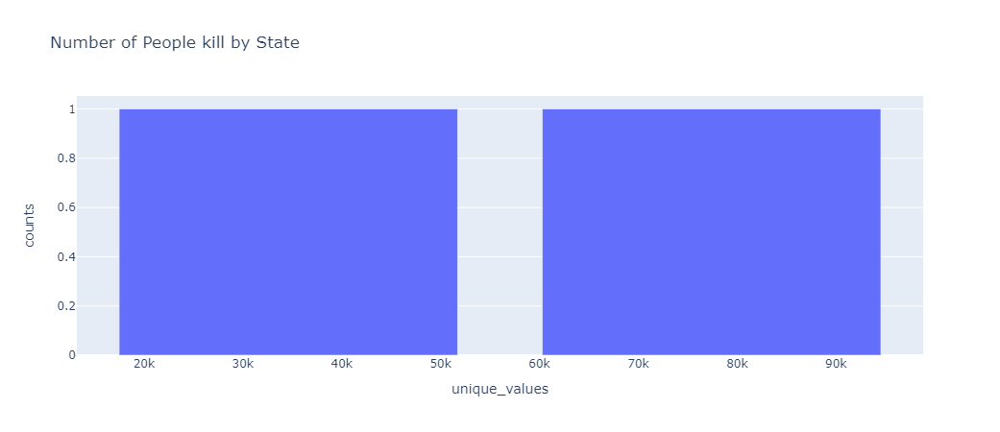

In [205]:
import plotly.express as px

fig = px.bar(df4, x="unique_values", y="counts", title="Number of People kill by State")
fig.show()

df

# Graph Functions
---

In [219]:
mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)


In [590]:

df = pd.read_csv('https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/final.csv', index_col=[0])
state_pop = pd.read_csv("https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/state_pop.csv", index_col=[0])

## Functions
def bar_incident(state_pop, df, start_date:str, end_date:str, groupby,asc=True):
    """
    This function serves to generate bar graphs that represent rate of deadly police shooting
    with filter that is determined by user inputs.
    
    The function can take in certian start and end_date and limit the data representation to those
    stated timeframes.
    
    This funcation can group the data set to show the graph represending user specific Zipcodes and States.
    """
    groupby = groupby
    state = state_pop.copy()
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    if "National" in groupby:
        test_df = df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fin = pd.merge(state_pop, test_df, how="inner", on="State")
        fin['count/popPermillions'] = round(fin["counts"]/fin["Pop. Millions"])
        fin = fin.sort_values(by="count/popPermillions")
        fig = px.bar(fin, x="State", y="count/popPermillions", title="Number of People killed by police in the Selected States", color="State")
        return fig.show()
    if "States" in groupby:
        test_df = df.loc[df["State"].isin(groupby["States"])]
        test_df = test_df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fin = pd.merge(state_pop, test_df, how="inner", on="State")
        fin['count/popPermillions'] = round(fin["counts"]/fin["Pop. Millions"])
        fin = fin.sort_values(by="count/popPermillions")
        fig = px.bar(fin, x="State", y="count/popPermillions", title="Number of People killed by police in the Selected States", color="State")
        return fig.show()          
    if "Zipcode" in groupby:
        test_df = df.loc[df["Zipcode"].isin(groupby["Zipcode"])]
        test_df = test_df['Zipcode'].value_counts().sort_values(ascending=asc).rename_axis('Zipcode').reset_index(name='counts')
        test_df['Zipcode'] = test_df["Zipcode"].astype(int)
        test_df['Zipcode'] = test_df["Zipcode"].astype(str)
        fig = px.bar(test_df, x="Zipcode", y="counts", title="Number of People killed by police in the Zipcode", color="Zipcode")
        return fig.show()  
    if "City" in groupby:
        test_df = df.loc[df["CityState"].isin(groupby["City"])]
        test_df = test_df['CityState'].value_counts().sort_values(ascending=asc).rename_axis('CityState').reset_index(name='counts')
        fig = px.bar(test_df, x="CityState", y="counts", title="Number of People killed by police in the selected City", color="CityState")
        return fig.show()    
    
    return "No Selection or invalid inputs"

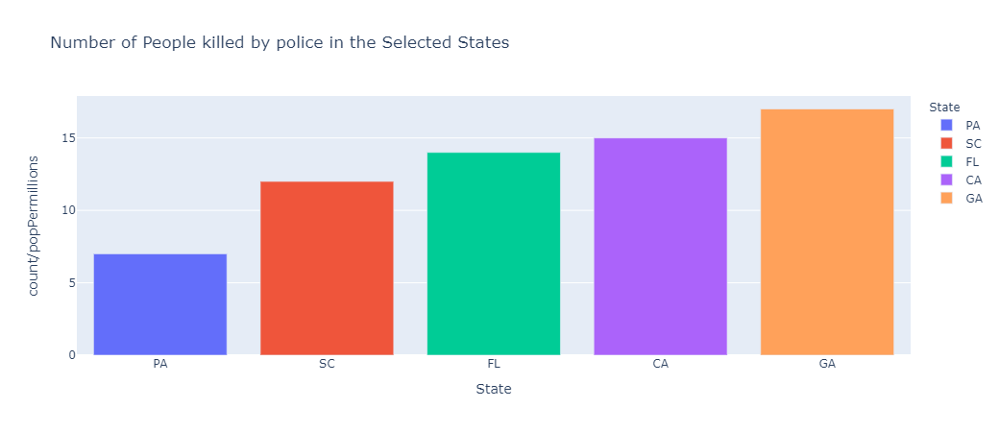

In [591]:
group_by = {"National":True}
bar_incident(state_pop, df, start_date, end_date, groupby_st,asc)


In [408]:
city = "Atlanta ,GA"
"Atlanta,GA"
cities = ["Atlanta","GA"]

In [570]:
# Test inputs 
start_date = "2017-01-01"
end_date = "2028-01-24"
groupby_nat = {"National":True}
groupby_st = {"States":["GA","FL","SC", "CA", "PA"]}
groupby_zip = {"Zipcode": [77414.0, 34614.0]}
groupby_cit = {"City": ["Atlanta,GA"]}
asc = True

In [565]:
# Projected sample input
User_inputs = {"graph_type":"bar",
               "graph_topic":"incident",
               "start_date": "01/24/2017",
               "end_date": "01/24/2028",
               "Groupby": {"State": ["GA","FL","SC", "CA", "PA"]},
               "asc": True}

In [581]:
state_pop

,State,Pop. Millions
0,AL,5.0
1,AK,1.0
2,AZ,7.0
3,AR,3.0
4,CA,39.0
...,...,...
46,VA,8.0
47,WA,7.0
48,WV,2.0
49,WI,6.0


In [582]:
test_df = bar_incident(state_pop, df, start_date, end_date, groupby_nat, asc)

TypeError: bar_incident() missing 1 required positional argument: 'groupby'

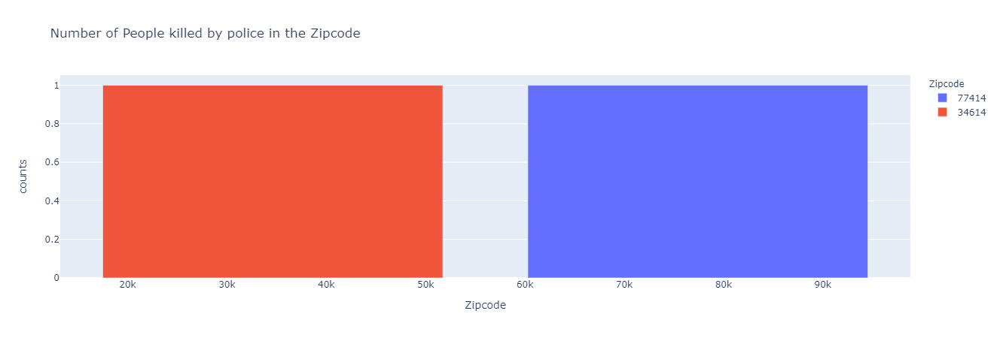

In [398]:
test_df = bar_incident(df, start_date, end_date, groupby_zip)

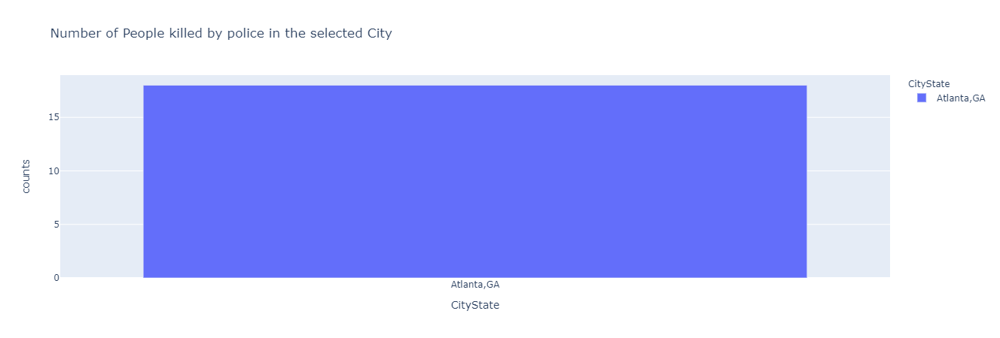

In [399]:
test_df = bar_incident(df, start_date, end_date, groupby_cit, asc)

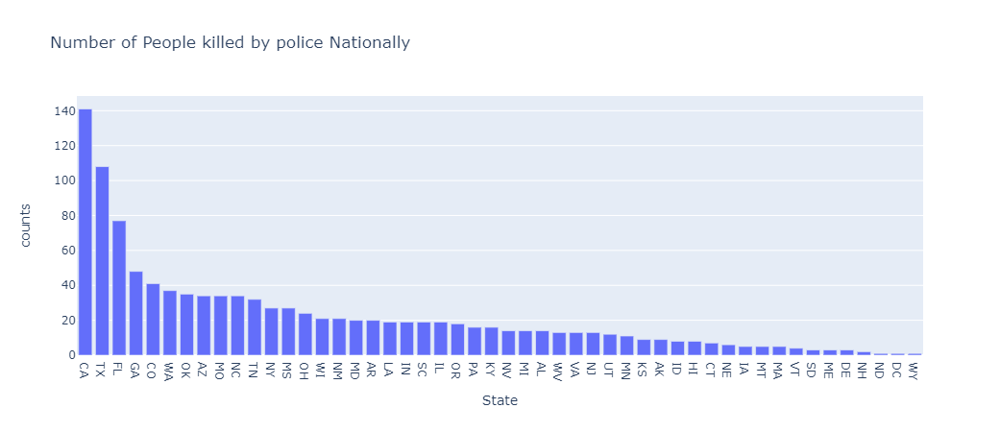

In [400]:
import plotly.express as px

fig = px.bar(df4, x="State", y="counts", title="Number of People killed by police Nationally")
fig.show()

In [401]:
df["CityState"] = df["City"]+","+df["State"]

In [537]:
df= pd.read_csv("final.csv")

In [526]:
start_date = "2020-01-01"
end_date = "2020-12-31"

df = df.copy()
mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
df = df.loc[mask]


In [527]:
df['Victim\'s race'].value_counts(10)

White               0.362069
Unknown race        0.264368
Black               0.205747
Hispanic            0.140230
Asian               0.012644
Native American     0.008046
Pacific Islander    0.004598
Unknown             0.002299
Name: Victim's race, dtype: float64

In [528]:
df2020 = df['Victim\'s race'].value_counts(10).sort_values(ascending=asc).rename_axis('Demographic').reset_index(name='Percentage')

In [529]:
df2020

,Demographic,Percentage
0,Unknown,0.002299
1,Pacific Islander,0.004598
2,Native American,0.008046
3,Asian,0.012644
4,Hispanic,0.140230
5,Black,0.205747
6,Unknown race,0.264368
7,White,0.362069


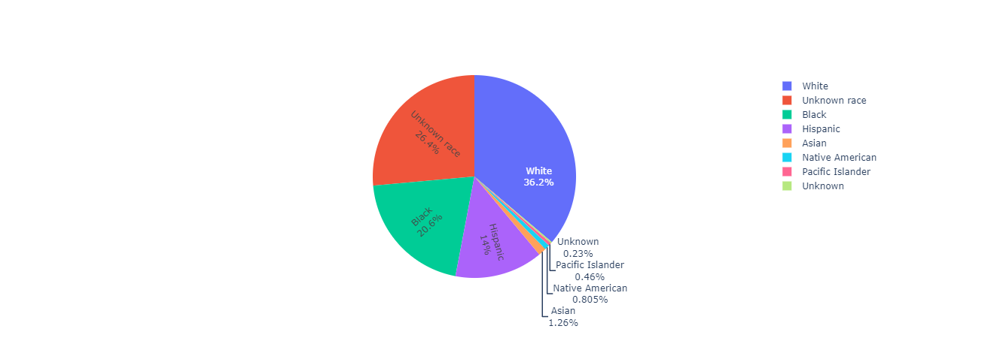

In [530]:
import plotly.graph_objects as go

labels = df2020["Demographic"]
values = df2020["Percentage"]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                             insidetextorientation='radial'
                            )])
fig.show()

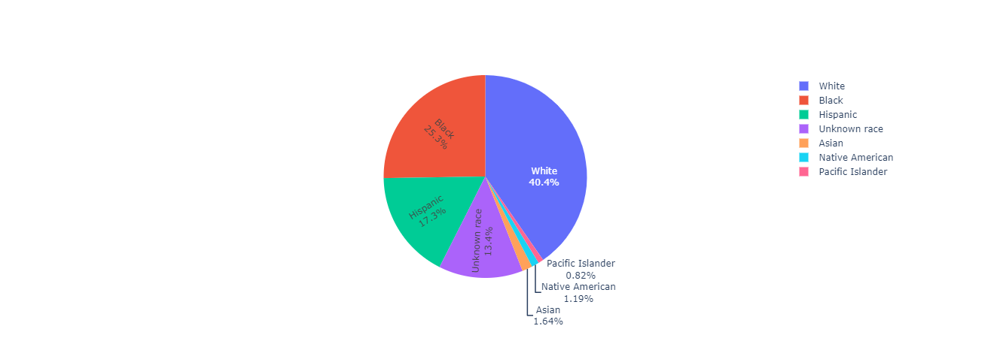

In [534]:
start_date = "2019-01-01"
end_date = "2019-12-31"

df2019 = df.copy()
mask =  (df2019['Date of Incident (month/day/year)'] > start_date) & ( df2019['Date of Incident (month/day/year)'] <= end_date)
df2019 = df2019.loc[mask]
df2019 = df2019['Victim\'s race'].value_counts(10).sort_values(ascending=asc).rename_axis('Demographic').reset_index(name='Percentage')
labels = df2019["Demographic"]
values = df2019["Percentage"]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                             insidetextorientation='radial'
                            )])
fig.show()

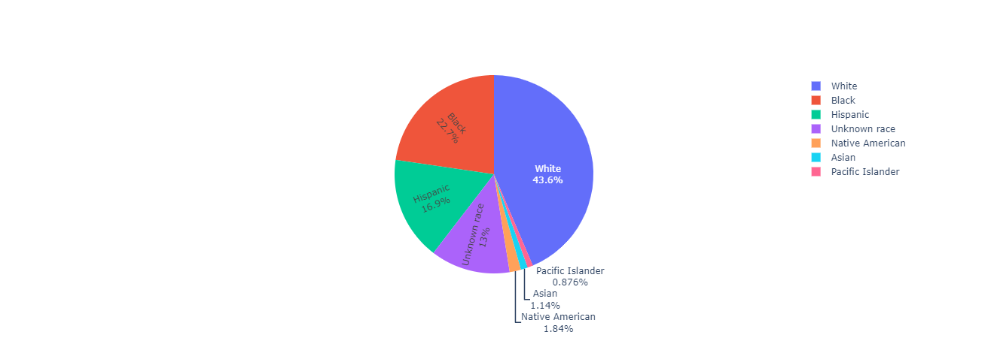

In [535]:
start_date = "2018-01-01"
end_date = "2018-12-31"

df2018 = df.copy()
mask =  (df2018['Date of Incident (month/day/year)'] > start_date) & ( df2018['Date of Incident (month/day/year)'] <= end_date)
df2018= df2018.loc[mask]
df2018= df2018['Victim\'s race'].value_counts(10).sort_values(ascending=asc).rename_axis('Demographic').reset_index(name='Percentage')
labels = df2018["Demographic"]
values = df2018["Percentage"]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                             insidetextorientation='radial'
                            )])
fig.show()

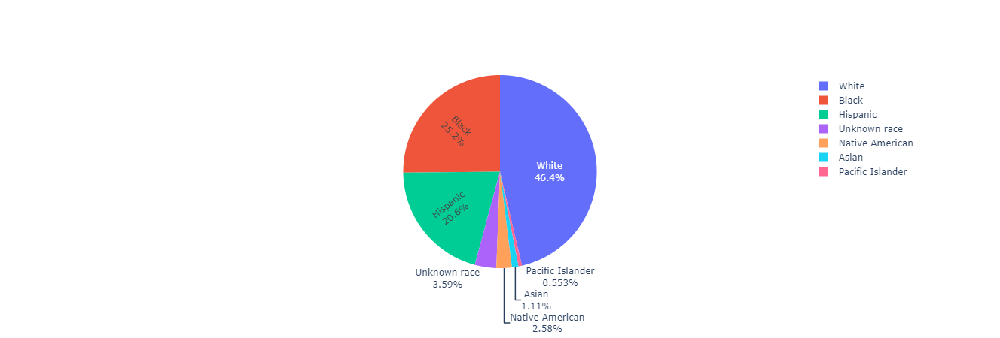

In [538]:
start_date = "2017-01-01"
end_date = "2017-12-31"

df2017 = df.copy()
mask =  (df2017['Date of Incident (month/day/year)'] > start_date) & ( df2017['Date of Incident (month/day/year)'] <= end_date)
df2017 = df2017.loc[mask]
df2017 = df2017['Victim\'s race'].value_counts(10).sort_values(ascending=asc).rename_axis('Demographic').reset_index(name='Percentage')
labels = df2017["Demographic"]
values = df2017["Percentage"]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                             insidetextorientation='radial'
                            )])
fig.show()

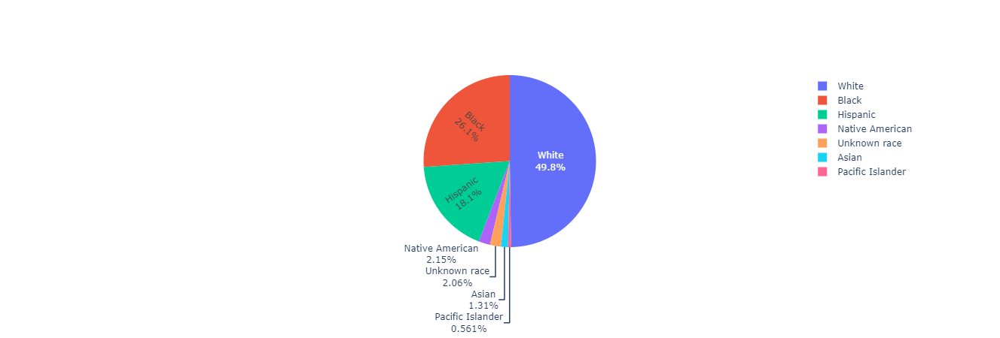

In [539]:
start_date = "2016-01-01"
end_date = "2016-12-31"


df2016 = df.copy()
mask =  (df2016['Date of Incident (month/day/year)'] > start_date) & ( df2016['Date of Incident (month/day/year)'] <= end_date)
df2016 = df2016.loc[mask]
df2016 = df2016['Victim\'s race'].value_counts(10).sort_values(ascending=asc).rename_axis('Demographic').reset_index(name='Percentage')
labels = df2016["Demographic"]
values = df2016["Percentage"]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                             insidetextorientation='radial'
                            )])
fig.show()

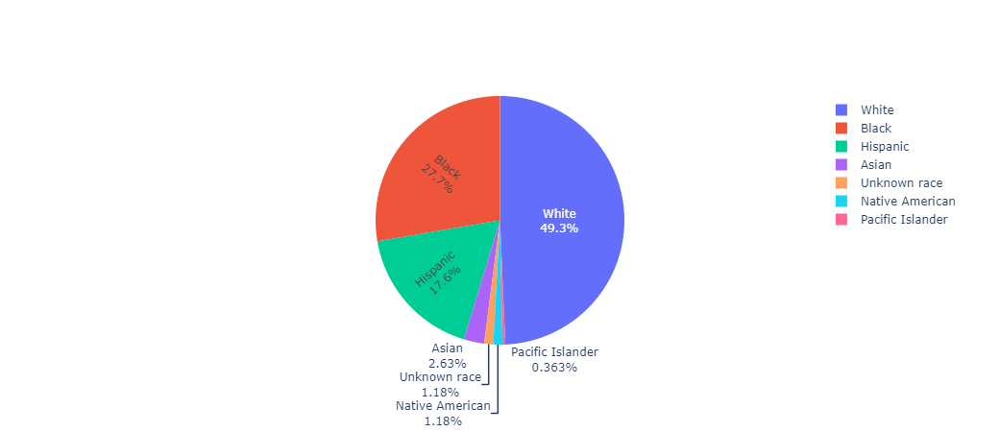

In [540]:
start_date = "2015-01-01"
end_date = "2015-12-31"

df2015 = df.copy()
mask =  (df2015['Date of Incident (month/day/year)'] > start_date) & ( df2015['Date of Incident (month/day/year)'] <= end_date)
df2015 = df2015.loc[mask]
df2015 = df2015['Victim\'s race'].value_counts(10).sort_values(ascending=asc).rename_axis('Demographic').reset_index(name='Percentage')
labels = df2015["Demographic"]
values = df2015["Percentage"]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                             insidetextorientation='radial'
                            )])
fig.show()

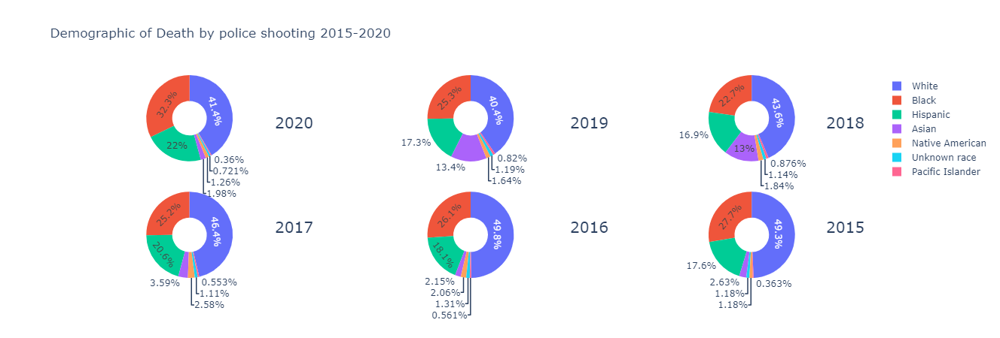

In [541]:
labels = df2015["Demographic"]
from plotly.subplots import make_subplots

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=2, cols=3, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}],[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=df2020['Percentage'], name="2020"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=df2019['Percentage'], name="2019"),
              1, 2)
fig.add_trace(go.Pie(labels=labels, values=df2018['Percentage'], name="2018"),
              1, 3)
fig.add_trace(go.Pie(labels=labels, values=df2017['Percentage'], name="2017"),
              2, 1)
fig.add_trace(go.Pie(labels=labels, values=df2016['Percentage'], name="2016"),
              2, 2)
fig.add_trace(go.Pie(labels=labels, values=df2015['Percentage'], name="2015"),
              2, 3)
# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Demographic of Death by police shooting 2015-2020",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='2020', x=0.25, y=0.82, font_size=20, showarrow=False),
                 dict(text='2019', x=0.65, y=0.82, font_size=20, showarrow=False),
                 dict(text='2015', x=1.0, y=0.2, font_size=20, showarrow=False),
                 dict(text='2017', x=0.25, y=0.2, font_size=20, showarrow=False),
                 dict(text='2016', x=0.65, y=0.2, font_size=20, showarrow=False),
                 dict(text='2018', x=1.0, y=0.82, font_size=20, showarrow=False)])
fig.show()

In [481]:
df

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID
0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,NaN,Emmitsburg,MD,NaN,Frederick,Frederick County Sheriff's Department,MD0110000,Gunshot,"Selmer and another man, David Leatherman, led ...",Pending investigation,No known charges,https://baltimore.cbslocal.com/2020/10/20/emmi...,No,Allegedly Armed,gun,attack,other,No,6244.0,NaN,NaN,NaN,NaN
1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,NaN,Suffolk,Suffolk County Police Department,NY0510100,Gunshot,Officers responded to a 911 report of a violen...,Pending investigation,No known charges,https://dailyvoice.com/new-york/nassau/police-...,No,Allegedly Armed,knife,other,NaN,No,6243.0,NaN,NaN,NaN,NaN
2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,NaN,South Milwaukee,WI,NaN,NaN,South Milwaukee Police Department,WI0411400,Gunshot,Officers responded to a report of a suicidal s...,Pending investigation,No known charges,https://www.jsonline.com/story/communities/lak...,Yes,Allegedly Armed,gun,attack,Not fleeing,No,6242.0,NaN,NaN,NaN,NaN
3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,NaN,Tooele,UT,NaN,NaN,Tooele Police Department,UT0230100,Gunshot,Koonwaiyou had a protective order filed agains...,Pending investigation,No known charges,https://kutv.com/news/local/woman-used-as-a-sh...,No,Allegedly Armed,gun,other,Not fleeing,No,6247.0,NaN,NaN,NaN,NaN
4,Gregory Putnik,32,Male,White,NaN,2020-10-18,NaN,Fresno,CA,NaN,NaN,Fresno Police Department,CA0100500,Gunshot,Officers first responded to a failed carjackin...,Pending investigation,No known charges,https://kmph.com/news/local/one-dead-in-office...,No,Allegedly Armed,gun,attack,Foot,No,6245.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008.0,Pueblo,Pueblo Police Department,CO0510100,Gunshot,Christopher was with two others in a car. Pueb...,Justified,No known charges,http://www.krdo.com/news/Pueblo-Police-shoot-k...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,4.0,12176.0
8516,Abel Gurrola,26,Male,Hispanic,http://www.bakersfieldnow.com/news/local/A-26-...,2013-01-01,720 Terrace Way,Bakersfield,CA,93304.0,Kern,Bakersfield Police Department,CA0150200,Gunshot,Officers responded to reports of gunshots at a...,Justified,No known charges,http://www.bakersfieldcalifornian.com/local/br...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Urban,3.0,12174.0
8517,Mark Chavez,49,Male,Hispanic,http://www.tricitytribuneusa.com/wp-content/up...,2013-01-01,912 Loma Linda Ave.,Farmington,NM,87401.0,San Juan,Farmington Police Department,NM0240200,Gunshot,An officer responded to a report by Chavez tha...,Unreported,No known charges,http://www.daily-times.com/farmington-news/ci_...,No,Allegedly Armed,blunt weapon,NaN,NaN,NaN,NaN,NaN,Urban,1.0,12175.0
8518,Andrew L. Closson,21,Male,White,http://www.superiortelegram.com/sites/default/...,2013-01-01,U.S. High

In [486]:
df_t = df.copy()
mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
df_t = df_t.loc[mask]
df_t


,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID
5279,Keith Childress,23,Male,Black,http://www.killedbypolice.net/victims/151199.jpg,2015-12-31,8300 Golden Cypress Avenue,Las Vegas,NV,89117.0,Clark,Las Vegas Metropolitan Police Department,NV0020100,Gunshot,The U.S. Marshals were conducting surveillance...,Pending investigation,No known charges,http://www.reviewjournal.com/news/las-vegas/me...,Unknown,Unarmed/Did Not Have an Actual Weapon,no object,other,Not fleeing,Yes,1137.0,NaN,Urban,3259.0,17080.0
5280,Fred Perez,55,Male,Hispanic,NaN,2015-12-30,E Belmont Ave and N Weber Ave,Fresno,CA,93701.0,Fresno,Fresno Police Department,CA0100500,Gunshot,Perez was allegedly stabbing a woman repeatedl...,Pending investigation,No known charges,http://abc30.com/news/1-man-dead-after-an-offi...,Unknown,Allegedly Armed,knife,attack,Not fleeing,Yes,1135.0,NaN,Urban,3257.0,17079.0
5281,John Randell Veach,39,Male,Unknown race,NaN,2015-12-30,1115 N Higley Blvd,Rawlins,WY,82301.0,Carbon,Rawlins Police Department,WY0040100,Gunshot,Police shot someone while trying to take him i...,Pending investigation/No Known Charges,No known charges,http://trib.com/news/state-and-regional/rawlin...,Unknown,Unclear,undetermined,undetermined,NaN,No,1136.0,NaN,Rural,3258.0,17078.0
5282,Tien Hua,33,Male,Asian,NaN,2015-12-29,3500 Strang Ave,Rosemead,CA,91770.0,Los Angeles,Los Angeles Police Department,CA0194200,Gunshot,"Hua, a suspect in a recent murder, was killed ...",Pending investigation/No Known Charges,No known charges,http://www.nbclosangeles.com/news/local/barric...,Unknown,Unclear,unknown weapon,undetermined,Not fleeing,No,1134.0,NaN,Urban,3256.0,17076.0
5283,Siolosega Velega-Nuufolau,50,Female,Pacific Islander,http://www.killedbypolice.net/victims/151192.jpg,2015-12-29,29000 Del Sol Ct,Santa Nella Village,CA,95322.0,Merced,Merced County Sheriff's Department,CA0240000,Gunshot,Velega-Nuufolau was reportedly standing in a n...,Pending investigation,No known charges,http://www.fresnobee.com/news/local/crime/arti...,Yes,Allegedly Armed,knife,other,Not fleeing,No,1133.0,NaN,Rural,3254.0,17077.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6375,Kenneth Brown,18,Male,White,http://www.killedbypolice.net/victims/150095.jpg,2015-01-04,300 East Harrison Ave,Guthrie,OK,73044.0,Logan,Oklahoma Highway Patrol,OKOHP0000,Gunshot,A trooper made a traffic stop on the subject f...,Unreported,No known charges,http://www.news9.com/story/28012083/guthrie-te...,No,Allegedly Armed,gun,attack,Not fleeing,No,11.0,NaN,Rural,2161.0,15585.0
6376,Matthew Hoffman,32,Male,White,NaN,2015-01-04,Valencia Street and 17th Street,San Francisco,CA,94110.0,San Francisco,San Francisco Police Department,CA0380100,Gunshot,Matthew was shot and killed by San Francisco p...,Pending investigation/No Known Charges,No known charges,http://www.insidebayarea.com/breaking-news/ci_...,Yes,Unarmed/Did Not Have an Actual Weapon,toy weapon,attack,Not fleeing,No,8.0,NaN,Urban,2163.0,15586.0
6377,John Paul Quintero,23,Male,Hispanic,https://lintvksnw.files.wordpress.com/2015/01/...,2015-01-0

In [498]:
df_t['Unarmed/Did Not Have an Actual Weapon'].value_counts()

Allegedly Armed                          772
Unarmed/Did Not Have an Actual Weapon    218
Vehicle                                   61
Unclear                                   50
Name: Unarmed/Did Not Have an Actual Weapon, dtype: int64

In [499]:
df_t['Fleeing (Source: WaPo)'].value_counts()

Not fleeing    715
Car            143
Foot           108
Other           19
Name: Fleeing (Source: WaPo), dtype: int64

In [500]:
df_t['Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx )'].value_counts()

Suburban        547
Urban           290
Rural           251
Undetermined     13
Name: Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ), dtype: int64

In [501]:

df_t['Off-Duty Killing?'].value_counts()

Off-Duty    23
Name: Off-Duty Killing?, dtype: int64

In [504]:
df_t['Alleged Threat Level (Source: WaPo)'].value_counts()

attack          731
other           219
undetermined     44
Name: Alleged Threat Level (Source: WaPo), dtype: int64

In [507]:
df_t['Body Camera (Source: WaPo)'].value_counts()

No                 916
Yes                 74
Bystander Video      2
Name: Body Camera (Source: WaPo), dtype: int64

In [509]:
# Feature Selection

In [643]:
def pie_arm_unarmed(df, start_date:str, end_date:str, groupby):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    
    if groupby == "National":
        df = df['Unarmed/Did Not Have an Actual Weapon'].value_counts(10).sort_values(ascending=asc).rename_axis('Armed/Unarmed').reset_index(name='Percentage')
        labels = df["Armed/Unarmed"]
        values = df["Percentage"]
        fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                     insidetextorientation='radial'
                                    )])
        fig.update_layout(
            title="Percent of Armed vs. Unarmed victims",
            xaxis_title="X Axis Title",
            yaxis_title="X Axis Title",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="RebeccaPurple"))
        return fig.show()
    if "States" in groupby:
        df = df.loc[df['State'].isin(groupby["States"])]
        df = df['Unarmed/Did Not Have an Actual Weapon'].value_counts(10).sort_values(ascending=asc).rename_axis('Armed/Unarmed').reset_index(name='Percentage')
        labels = df["Armed/Unarmed"]
        values = df["Percentage"]
        fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                     insidetextorientation='radial',
                                    )])
        fig.update_layout(
            title="Percent of Armed vs. Unarmed victims",
            xaxis_title="X Axis Title",
            yaxis_title="X Axis Title",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="RebeccaPurple"))
        return fig.show()         
    if "City" in groupby:
        df = df.loc[df['City_State'].isin(groupby["City"])]
        df = df['Unarmed/Did Not Have an Actual Weapon'].value_counts(10).sort_values(ascending=asc).rename_axis('Armed/Unarmed').reset_index(name='Percentage')
        labels = df["Armed/Unarmed"]
        values = df["Percentage"]
        fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                     insidetextorientation='radial'
                                    )]) 
        fig.update_layout(
            title="Percent of Armed vs. Unarmed victims",
            xaxis_title="X Axis Title",
            yaxis_title="X Axis Title",
            font=dict(
                family="Courier New, monospace",
                size=18,
                color="RebeccaPurple"))
        return fig.show()
    return "No Selection or invalid inputs"

In [631]:
# Test inputs 
start_date = "01/24/2011"
end_date = "01/24/2028"
groupby_nat = "National"
groupby_st = {"States":["GA","FL","SC", "CA", "PA"]}
groupby_zip = {"Zipcode": [77414.0, 34614.0]}
groupby_cit = {"City": ["Emmitsburg, MD", 'Coram, NY', 'Tooele, UT']}
asc = True

In [632]:
mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
df = df.loc[mask]
    

In [633]:
df = df.loc[df['City_State'].isin(groupby_cit["City"])].copy()


In [615]:
dfc = df['Unarmed/Did Not Have an Actual Weapon'].value_counts(10).sort_values(ascending=asc).rename_axis('Armed/Unarmed').reset_index(name='Percentage')

In [616]:
dfc

,Armed/Unarmed,Percentage
0,Vehicle,0.065962
1,Unclear,0.081925
2,Unarmed/Did Not Have an Actual Weapon,0.136620
3,Allegedly Armed,0.715493


In [641]:
df = pd.read_excel("./Datasets/PoliceShooting.xlsx")
df['City_State'] = df['City']+', '+df['State']

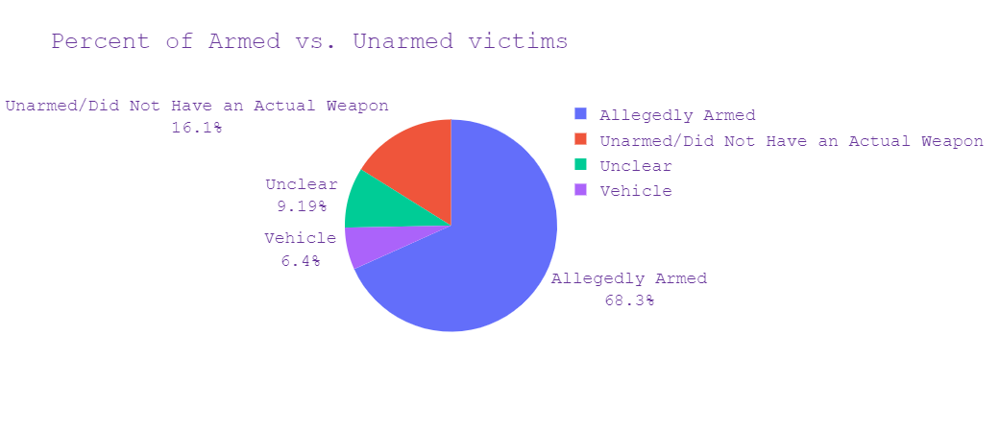

In [644]:
pie_arm_unarmed(df, start_date, end_date, groupby_st)

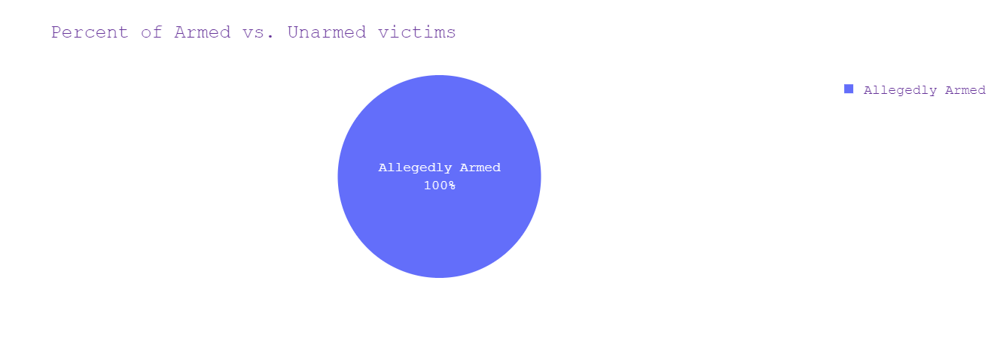

In [645]:
pie_arm_unarmed(df, start_date, end_date, groupby_cit)

In [568]:
df['City_State'] = df['City']+', '+df['State']

In [583]:
groupby_cit["City"]

['Emmitsburg, MD', 'Coram, NY', 'Tooele, UT']

In [554]:
df = df.loc[df['City_State'].isin(groupby_cit["City"])].copy()

In [646]:
df

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID,City_State
0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,NaN,Emmitsburg,MD,NaN,Frederick,Frederick County Sheriff's Department,MD0110000,Gunshot,"Selmer and another man, David Leatherman, led ...",Pending investigation,No known charges,https://baltimore.cbslocal.com/2020/10/20/emmi...,No,Allegedly Armed,gun,attack,other,No,6244.0,NaN,NaN,NaN,NaN,"Emmitsburg, MD"
1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,NaN,Suffolk,Suffolk County Police Department,NY0510100,Gunshot,Officers responded to a 911 report of a violen...,Pending investigation,No known charges,https://dailyvoice.com/new-york/nassau/police-...,No,Allegedly Armed,knife,other,NaN,No,6243.0,NaN,NaN,NaN,NaN,"Coram, NY"
2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,NaN,South Milwaukee,WI,NaN,NaN,South Milwaukee Police Department,WI0411400,Gunshot,Officers responded to a report of a suicidal s...,Pending investigation,No known charges,https://www.jsonline.com/story/communities/lak...,Yes,Allegedly Armed,gun,attack,Not fleeing,No,6242.0,NaN,NaN,NaN,NaN,"South Milwaukee, WI"
3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,NaN,Tooele,UT,NaN,NaN,Tooele Police Department,UT0230100,Gunshot,Koonwaiyou had a protective order filed agains...,Pending investigation,No known charges,https://kutv.com/news/local/woman-used-as-a-sh...,No,Allegedly Armed,gun,other,Not fleeing,No,6247.0,NaN,NaN,NaN,NaN,"Tooele, UT"
4,Gregory Putnik,32,Male,White,NaN,2020-10-18,NaN,Fresno,CA,NaN,NaN,Fresno Police Department,CA0100500,Gunshot,Officers first responded to a failed carjackin...,Pending investigation,No known charges,https://kmph.com/news/local/one-dead-in-office...,No,Allegedly Armed,gun,attack,Foot,No,6245.0,NaN,NaN,NaN,NaN,"Fresno, CA"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008.0,Pueblo,Pueblo Police Department,CO0510100,Gunshot,Christopher was with two others in a car. Pueb...,Justified,No known charges,http://www.krdo.com/news/Pueblo-Police-shoot-k...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,4.0,12176.0,"Pueblo, CO"
8516,Abel Gurrola,26,Male,Hispanic,http://www.bakersfieldnow.com/news/local/A-26-...,2013-01-01,720 Terrace Way,Bakersfield,CA,93304.0,Kern,Bakersfield Police Department,CA0150200,Gunshot,Officers responded to reports of gunshots at a...,Justified,No known charges,http://www.bakersfieldcalifornian.com/local/br...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Urban,3.0,12174.0,"Bakersfield, CA"
8517,Mark Chavez,49,Male,Hispanic,http://www.tricitytribuneusa.com/wp-content/up...,2013-01-01,912 Loma Linda Ave.,Farmington,NM,87401.0,San Juan,Farmington Police Department,NM0240200,Gunshot,An officer responded to a report by Chavez tha...,Unreported,No known charges,http://www.daily-times.com/farmington-news/ci_...,No,Allegedly Armed,blunt weapon,NaN,NaN,NaN,NaN,NaN,Ur

In [649]:
df

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID,City_State
0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,,Emmitsburg,MD,NaN,Frederick,Frederick County Sheriff's Department,MD0110000,Gunshot,"Selmer and another man, David Leatherman, led ...",Pending investigation,No known charges,https://baltimore.cbslocal.com/2020/10/20/emmi...,No,Allegedly Armed,gun,attack,other,No,6244.0,NaN,NaN,NaN,NaN,"Emmitsburg, MD"
1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,NaN,Suffolk,Suffolk County Police Department,NY0510100,Gunshot,Officers responded to a 911 report of a violen...,Pending investigation,No known charges,https://dailyvoice.com/new-york/nassau/police-...,No,Allegedly Armed,knife,other,NaN,No,6243.0,NaN,NaN,NaN,NaN,"Coram, NY"
2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,,South Milwaukee,WI,NaN,NaN,South Milwaukee Police Department,WI0411400,Gunshot,Officers responded to a report of a suicidal s...,Pending investigation,No known charges,https://www.jsonline.com/story/communities/lak...,Yes,Allegedly Armed,gun,attack,Not fleeing,No,6242.0,NaN,NaN,NaN,NaN,"South Milwaukee, WI"
3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,,Tooele,UT,NaN,NaN,Tooele Police Department,UT0230100,Gunshot,Koonwaiyou had a protective order filed agains...,Pending investigation,No known charges,https://kutv.com/news/local/woman-used-as-a-sh...,No,Allegedly Armed,gun,other,Not fleeing,No,6247.0,NaN,NaN,NaN,NaN,"Tooele, UT"
4,Gregory Putnik,32,Male,White,NaN,2020-10-18,,Fresno,CA,NaN,NaN,Fresno Police Department,CA0100500,Gunshot,Officers first responded to a failed carjackin...,Pending investigation,No known charges,https://kmph.com/news/local/one-dead-in-office...,No,Allegedly Armed,gun,attack,Foot,No,6245.0,NaN,NaN,NaN,NaN,"Fresno, CA"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008.0,Pueblo,Pueblo Police Department,CO0510100,Gunshot,Christopher was with two others in a car. Pueb...,Justified,No known charges,http://www.krdo.com/news/Pueblo-Police-shoot-k...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,4.0,12176.0,"Pueblo, CO"
8516,Abel Gurrola,26,Male,Hispanic,http://www.bakersfieldnow.com/news/local/A-26-...,2013-01-01,720 Terrace Way,Bakersfield,CA,93304.0,Kern,Bakersfield Police Department,CA0150200,Gunshot,Officers responded to reports of gunshots at a...,Justified,No known charges,http://www.bakersfieldcalifornian.com/local/br...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Urban,3.0,12174.0,"Bakersfield, CA"
8517,Mark Chavez,49,Male,Hispanic,http://www.tricitytribuneusa.com/wp-content/up...,2013-01-01,912 Loma Linda Ave.,Farmington,NM,87401.0,San Juan,Farmington Police Department,NM0240200,Gunshot,An officer responded to a report by Chavez tha...,Unreported,No known charges,http://www.daily-times.com/farmington-news/ci_...,No,Allegedly Armed,blunt weapon,NaN,NaN,NaN,NaN,NaN,Urban,1.0,1217

In [653]:
df['Street Address of Incident'].fillna('', inplace=True)
df['Zipcode'].fillna("", inplace=True)

In [656]:
df["Adress"] = df['Street Address of Incident'] + " " + df['City'] + ", " + df["State"]

In [657]:
df

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID,City_State,Adress
0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,,Emmitsburg,MD,,Frederick,Frederick County Sheriff's Department,MD0110000,Gunshot,"Selmer and another man, David Leatherman, led ...",Pending investigation,No known charges,https://baltimore.cbslocal.com/2020/10/20/emmi...,No,Allegedly Armed,gun,attack,other,No,6244.0,NaN,NaN,NaN,NaN,"Emmitsburg, MD","Emmitsburg, MD"
1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,,Suffolk,Suffolk County Police Department,NY0510100,Gunshot,Officers responded to a 911 report of a violen...,Pending investigation,No known charges,https://dailyvoice.com/new-york/nassau/police-...,No,Allegedly Armed,knife,other,NaN,No,6243.0,NaN,NaN,NaN,NaN,"Coram, NY","5306 Towne Woods Road Coram, NY"
2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,,South Milwaukee,WI,,NaN,South Milwaukee Police Department,WI0411400,Gunshot,Officers responded to a report of a suicidal s...,Pending investigation,No known charges,https://www.jsonline.com/story/communities/lak...,Yes,Allegedly Armed,gun,attack,Not fleeing,No,6242.0,NaN,NaN,NaN,NaN,"South Milwaukee, WI","South Milwaukee, WI"
3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,,Tooele,UT,,NaN,Tooele Police Department,UT0230100,Gunshot,Koonwaiyou had a protective order filed agains...,Pending investigation,No known charges,https://kutv.com/news/local/woman-used-as-a-sh...,No,Allegedly Armed,gun,other,Not fleeing,No,6247.0,NaN,NaN,NaN,NaN,"Tooele, UT","Tooele, UT"
4,Gregory Putnik,32,Male,White,NaN,2020-10-18,,Fresno,CA,,NaN,Fresno Police Department,CA0100500,Gunshot,Officers first responded to a failed carjackin...,Pending investigation,No known charges,https://kmph.com/news/local/one-dead-in-office...,No,Allegedly Armed,gun,attack,Foot,No,6245.0,NaN,NaN,NaN,NaN,"Fresno, CA","Fresno, CA"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008,Pueblo,Pueblo Police Department,CO0510100,Gunshot,Christopher was with two others in a car. Pueb...,Justified,No known charges,http://www.krdo.com/news/Pueblo-Police-shoot-k...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,4.0,12176.0,"Pueblo, CO","Highway 50 and North Elizabeth Street Pueblo, CO"
8516,Abel Gurrola,26,Male,Hispanic,http://www.bakersfieldnow.com/news/local/A-26-...,2013-01-01,720 Terrace Way,Bakersfield,CA,93304,Kern,Bakersfield Police Department,CA0150200,Gunshot,Officers responded to reports of gunshots at a...,Justified,No known charges,http://www.bakersfieldcalifornian.com/local/br...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Urban,3.0,12174.0,"Bakersfield, CA","720 Terrace Way Bakersfield, CA"
8517,Mark Chavez,49,Male,Hispanic,http://www.tricitytribuneusa.com/wp-content/up...,2013-01-01,912 Loma Linda Ave.,Farmington,NM,87401,San Juan,Farmington Police Department,NM0240200,Gunshot,An officer responded

In [658]:
!pip install geopandas

In [659]:
!pip install geopy

In [673]:
from geopy.geocoders import Nominatim
import geopy.geocoders
geopy.geocoders.options.default_user_agent = 'PoliceViolence'
geolocator = Nominatim()

In [674]:
locator = Nominatim(user_agent="PoliceViolence")
location = locator.geocode("Champ de Mars, Paris, France")
location

Location(Champ de Mars, Rue du Capitaine Scott, Quartier de Grenelle, Paris, Île-de-France, France métropolitaine, 75015, France, (48.85614465, 2.297820393322227, 0.0))

In [ ]:
from geopy.extra.rate_limiter import RateLimiter

geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1/20)
df['location'] = df['Adress'].apply(geocode)

df['point'] = df['location'].apply(lambda loc: tuple(loc.point) if loc else None)

In [672]:
df.to_csv('finish.csv', index=True)

In [683]:
df = pd.read_csv('finish.csv')
df

,Unnamed: 0,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID,City_State,Adress,location,point
0,0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,NaN,Emmitsburg,MD,NaN,Frederick,Frederick County Sheriff's Department,MD0110000,Gunshot,"Selmer and another man, David Leatherman, led ...",Pending investigation,No known charges,https://baltimore.cbslocal.com/2020/10/20/emmi...,No,Allegedly Armed,gun,attack,other,No,6244.0,NaN,NaN,NaN,NaN,"Emmitsburg, MD","Emmitsburg, MD","Emmitsburg, Frederick County, Maryland, United...","(39.7045417, -77.3269307, 0.0)"
1,1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,NaN,Suffolk,Suffolk County Police Department,NY0510100,Gunshot,Officers responded to a 911 report of a violen...,Pending investigation,No known charges,https://dailyvoice.com/new-york/nassau/police-...,No,Allegedly Armed,knife,other,NaN,No,6243.0,NaN,NaN,NaN,NaN,"Coram, NY","5306 Towne Woods Road Coram, NY","5306, Towne Woods Road, Coram, Suffolk County,...","(40.87477914665149, -73.00924412825, 0.0)"
2,2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,NaN,South Milwaukee,WI,NaN,NaN,South Milwaukee Police Department,WI0411400,Gunshot,Officers responded to a report of a suicidal s...,Pending investigation,No known charges,https://www.jsonline.com/story/communities/lak...,Yes,Allegedly Armed,gun,attack,Not fleeing,No,6242.0,NaN,NaN,NaN,NaN,"South Milwaukee, WI","South Milwaukee, WI","South Milwaukee, Milwaukee County, Wisconsin, ...","(42.9105722, -87.8606367, 0.0)"
3,3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,NaN,Tooele,UT,NaN,NaN,Tooele Police Department,UT0230100,Gunshot,Koonwaiyou had a protective order filed agains...,Pending investigation,No known charges,https://kutv.com/news/local/woman-used-as-a-sh...,No,Allegedly Armed,gun,other,Not fleeing,No,6247.0,NaN,NaN,NaN,NaN,"Tooele, UT","Tooele, UT","Tooele County, Utah, United States of America","(40.4062872, -113.1966394, 0.0)"
4,4,Gregory Putnik,32,Male,White,NaN,2020-10-18,NaN,Fresno,CA,NaN,NaN,Fresno Police Department,CA0100500,Gunshot,Officers first responded to a failed carjackin...,Pending investigation,No known charges,https://kmph.com/news/local/one-dead-in-office...,No,Allegedly Armed,gun,attack,Foot,No,6245.0,NaN,NaN,NaN,NaN,"Fresno, CA","Fresno, CA","Fresno, Fresno County, California, United Stat...","(36.7394421, -119.7848307, 0.0)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008.0,Pueblo,Pueblo Police Department,CO0510100,Gunshot,Christopher was with two others in a car. Pueb...,Justified,No known charges,http://www.krdo.com/news/Pueblo-Police-shoot-k...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,4.0,12176.0,"Pueblo, CO","Highway 50 and North Elizabeth Street Pueblo, CO",NaN,NaN
8516,8516,Abel Gurrola,26,Male,Hispanic,http://www.bakersfieldnow.com/news/local/A-26-...,2013-01-01,720 Terrace 

In [702]:
df.point = df.point.str.rstrip(")")

In [703]:
df.point.dropna(inplace=True)

In [712]:
new = df.point.str.split(",",expand=True)
df["lon"] = new[0]
df["lat"] = new[1]

In [736]:
df

,Unnamed: 0,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID,City_State,Adress,location,point,lon,lat,month_year
0,0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,NaN,Emmitsburg,MD,NaN,Frederick,Frederick County Sheriff's Department,MD0110000,Gunshot,"Selmer and another man, David Leatherman, led ...",Pending investigation,No known charges,https://baltimore.cbslocal.com/2020/10/20/emmi...,No,Allegedly Armed,gun,attack,other,No,6244.0,NaN,NaN,NaN,NaN,"Emmitsburg, MD","Emmitsburg, MD","Emmitsburg, Frederick County, Maryland, United...","39.7045417, -77.3269307, 0.0",39.704542,-77.326931,2020-10
1,1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,NaN,Suffolk,Suffolk County Police Department,NY0510100,Gunshot,Officers responded to a 911 report of a violen...,Pending investigation,No known charges,https://dailyvoice.com/new-york/nassau/police-...,No,Allegedly Armed,knife,other,NaN,No,6243.0,NaN,NaN,NaN,NaN,"Coram, NY","5306 Towne Woods Road Coram, NY","5306, Towne Woods Road, Coram, Suffolk County,...","40.87477914665149, -73.00924412825, 0.0",40.874779,-73.009244,2020-10
2,2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,NaN,South Milwaukee,WI,NaN,NaN,South Milwaukee Police Department,WI0411400,Gunshot,Officers responded to a report of a suicidal s...,Pending investigation,No known charges,https://www.jsonline.com/story/communities/lak...,Yes,Allegedly Armed,gun,attack,Not fleeing,No,6242.0,NaN,NaN,NaN,NaN,"South Milwaukee, WI","South Milwaukee, WI","South Milwaukee, Milwaukee County, Wisconsin, ...","42.9105722, -87.8606367, 0.0",42.910572,-87.860637,2020-10
3,3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,NaN,Tooele,UT,NaN,NaN,Tooele Police Department,UT0230100,Gunshot,Koonwaiyou had a protective order filed agains...,Pending investigation,No known charges,https://kutv.com/news/local/woman-used-as-a-sh...,No,Allegedly Armed,gun,other,Not fleeing,No,6247.0,NaN,NaN,NaN,NaN,"Tooele, UT","Tooele, UT","Tooele County, Utah, United States of America","40.4062872, -113.1966394, 0.0",40.406287,-113.196639,2020-10
4,4,Gregory Putnik,32,Male,White,NaN,2020-10-18,NaN,Fresno,CA,NaN,NaN,Fresno Police Department,CA0100500,Gunshot,Officers first responded to a failed carjackin...,Pending investigation,No known charges,https://kmph.com/news/local/one-dead-in-office...,No,Allegedly Armed,gun,attack,Foot,No,6245.0,NaN,NaN,NaN,NaN,"Fresno, CA","Fresno, CA","Fresno, Fresno County, California, United Stat...","36.7394421, -119.7848307, 0.0",36.739442,-119.784831,2020-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008.0,Pueblo,Pueblo Police Department,CO0510100,Gunshot,Christopher was with two others in a car. Pueb...,Justified,No known charges,http://www.krdo.com/news/Pueblo-Police-shoot-k...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,4.0,12176.0,"Pueblo, CO","Hig

In [735]:
df['month_year'] = pd.to_datetime(df['Date of Incident (month/day/year)']).dt.to_period('M')

In [727]:
df['lat'] = df['lat'].astype(float)
df['lon'] = df['lon'].astype(float)

In [767]:
df = df.drop(['Unnamed: 0'], axis=1)

In [768]:
df.to_csv("final.csv")

In [769]:
df

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID,City_State,Adress,location,point,lon,lat,month_year
0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,NaN,Emmitsburg,MD,NaN,Frederick,Frederick County Sheriff's Department,MD0110000,Gunshot,"Selmer and another man, David Leatherman, led ...",Pending investigation,No known charges,https://baltimore.cbslocal.com/2020/10/20/emmi...,No,Allegedly Armed,gun,attack,other,No,6244.0,NaN,NaN,NaN,NaN,"Emmitsburg, MD","Emmitsburg, MD","Emmitsburg, Frederick County, Maryland, United...","39.7045417, -77.3269307, 0.0",39.704542,-77.326931,2020-10
1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,NaN,Suffolk,Suffolk County Police Department,NY0510100,Gunshot,Officers responded to a 911 report of a violen...,Pending investigation,No known charges,https://dailyvoice.com/new-york/nassau/police-...,No,Allegedly Armed,knife,other,NaN,No,6243.0,NaN,NaN,NaN,NaN,"Coram, NY","5306 Towne Woods Road Coram, NY","5306, Towne Woods Road, Coram, Suffolk County,...","40.87477914665149, -73.00924412825, 0.0",40.874779,-73.009244,2020-10
2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,NaN,South Milwaukee,WI,NaN,NaN,South Milwaukee Police Department,WI0411400,Gunshot,Officers responded to a report of a suicidal s...,Pending investigation,No known charges,https://www.jsonline.com/story/communities/lak...,Yes,Allegedly Armed,gun,attack,Not fleeing,No,6242.0,NaN,NaN,NaN,NaN,"South Milwaukee, WI","South Milwaukee, WI","South Milwaukee, Milwaukee County, Wisconsin, ...","42.9105722, -87.8606367, 0.0",42.910572,-87.860637,2020-10
3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,NaN,Tooele,UT,NaN,NaN,Tooele Police Department,UT0230100,Gunshot,Koonwaiyou had a protective order filed agains...,Pending investigation,No known charges,https://kutv.com/news/local/woman-used-as-a-sh...,No,Allegedly Armed,gun,other,Not fleeing,No,6247.0,NaN,NaN,NaN,NaN,"Tooele, UT","Tooele, UT","Tooele County, Utah, United States of America","40.4062872, -113.1966394, 0.0",40.406287,-113.196639,2020-10
4,Gregory Putnik,32,Male,White,NaN,2020-10-18,NaN,Fresno,CA,NaN,NaN,Fresno Police Department,CA0100500,Gunshot,Officers first responded to a failed carjackin...,Pending investigation,No known charges,https://kmph.com/news/local/one-dead-in-office...,No,Allegedly Armed,gun,attack,Foot,No,6245.0,NaN,NaN,NaN,NaN,"Fresno, CA","Fresno, CA","Fresno, Fresno County, California, United Stat...","36.7394421, -119.7848307, 0.0",36.739442,-119.784831,2020-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008.0,Pueblo,Pueblo Police Department,CO0510100,Gunshot,Christopher was with two others in a car. Pueb...,Justified,No known charges,http://www.krdo.com/news/Pueblo-Police-shoot-k...,No,Allegedly Armed,gun,NaN,NaN,NaN,NaN,NaN,Suburban,4.0,12176.0,"Pueblo, CO","Highway 50 and North Elizabeth St

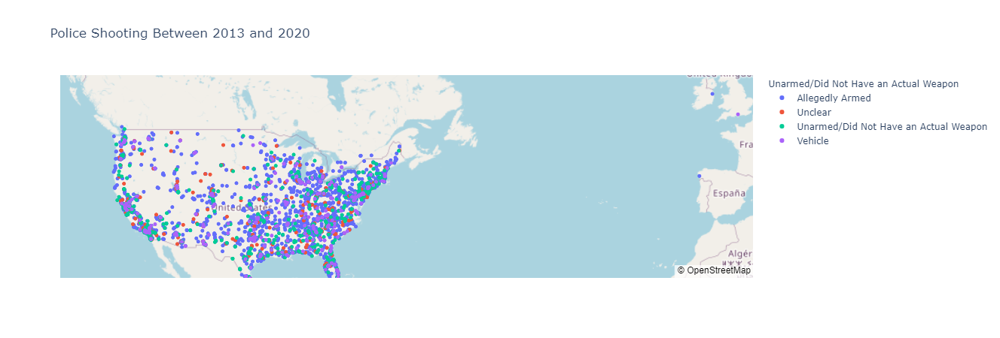

In [786]:
import plotly.graph_objects as go
import pandas as pd
start_date = "2013"
end_date = "2020"
mapbox_access_token = 'pk.eyJ1IjoicG9wa2RvZGdlIiwiYSI6ImNrZDdvZDFtbDAwNmwycW9xazQycWpldTYifQ.33ELrqLko1a0dHHEkSsxNw'


px.set_mapbox_access_token(mapbox_access_token)
fig = px.scatter_mapbox(df,
                        lat=df.lon,
                        lon=df.lat,
                        zoom=1,
                        hover_name= "Victim's name",
                        hover_data= ['Victim\'s age','Victim\'s gender','Victim\'s race',"State","City"],
                        color="Unarmed/Did Not Have an Actual Weapon",
                        title=f"Police Shooting Between {start_date} and {end_date}"
                       )
fig.update_layout(mapbox_style="open-street-map",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
fig.show()

In [772]:
list(df.columns)

["Victim's name",
 "Victim's age",
 "Victim's gender",
 "Victim's race",
 'URL of image of victim',
 'Date of Incident (month/day/year)',
 'Street Address of Incident',
 'City',
 'State',
 'Zipcode',
 'County',
 'Agency responsible for death',
 'ORI Agency Identifier (if available)',
 'Cause of death',
 'A brief description of the circumstances surrounding the death',
 'Official disposition of death (justified or other)',
 'Criminal Charges?',
 'Link to news article or photo of official document',
 'Symptoms of mental illness?',
 'Unarmed/Did Not Have an Actual Weapon',
 'Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database)',
 'Alleged Threat Level (Source: WaPo)',
 'Fleeing (Source: WaPo)',
 'Body Camera (Source: WaPo)',
 'WaPo ID (If included in WaPo database)',
 'Off-Duty Killing?',
 'Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx )',
 

In [725]:
df.lat.dtype

dtype('O')

In [776]:
# Projected sample input
User_inputs = {"graph_type":"bar",
               "graph_topic":"incident"
               "start_date": "01/24/2017",
               "end_date": "01/24/2028",
               "Groupby": {"State": ["GA","FL","SC", "CA"]},
               "asc": True}

SyntaxError: invalid syntax (<ipython-input-776-d6b43f350269>, line 4)

In [708]:
def pie_charts_vic(df, start_date:str, end_date:str, groupby, sort_by):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    
    if "National" in groupby:
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial'
                                        )])
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            {"Error": "invalid User inputs"}
        return fig.to_json()
    if "States" in groupby:
        df = df.loc[df['State'].isin(groupby["States"])]
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial',
                                        )])
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            return {"Error":"Invalid States Inputs"}
        return fig.to_json()         
    if "City" in groupby:
        df = df.loc[df['City_State'].isin(groupby["City"])]
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try: 
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial'
                                        )]) 
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            return {"Error":"Invalid States Inputs"}
        return fig.show()
    return "No Selection or invalid inputs"

In [837]:
def map_function(df, start_date, end_date, sort_by:str= "Armed/Unarmed"):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    mapbox_access_token = 'pk.eyJ1IjoicG9wa2RvZGdlIiwiYSI6ImNrZDdvZDFtbDAwNmwycW9xazQycWpldTYifQ.33ELrqLko1a0dHHEkSsxNw'
    if sort_by == "Armed/Unarmed":
        color="Unarmed/Did Not Have an Actual Weapon"
    if sort_by == "Demographic":
        color="Victim's race"
    if sort_by == "Gender":
        color="Victim's gender"
    px.set_mapbox_access_token(mapbox_access_token)
    fig = px.scatter_mapbox(df,
                            lat=df.lon,
                            lon=df.lat,
                            zoom=1,
                            hover_name= "Victim's name",
                            hover_data= ['Victim\'s age','Victim\'s gender','Victim\'s race',"State","City"],
                            color = color,
                            title=f"Police Shooting Between {start_date} and {end_date}"
                           )
    fig.update_layout(mapbox_style="open-street-map",
                      mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
    return fig.show()

    

In [831]:
df.to_csv("final.csv")

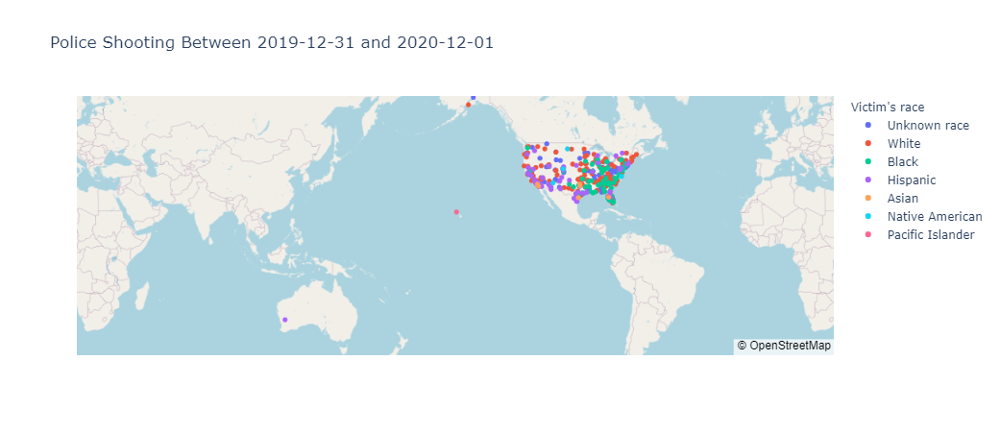

In [839]:
map_function(df, start_date, end_date,"Demographic")

In [808]:
dfc = df.copy()
mask =  (dfc['Date of Incident (month/day/year)'] > start_date) & ( dfc['Date of Incident (month/day/year)'] <= end_date)
dfc = dfc.loc[mask]

In [822]:
df["Victim\'s race"].replace(np.nan, "Unknown race",inplace=True)

In [828]:
df['Victim\'s gender'].value_counts(dropna=False)
df["Victim\'s gender"].replace(np.nan, "Unknown",inplace=True)

In [823]:
df["Victim\'s race"].replace(np.nan, "Unknown",inplace=True)

In [424]:
start_date = "2019-12-31"
end_date = "2020-12-01"

In [810]:
dfc

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,County,Agency responsible for death,ORI Agency Identifier (if available),Cause of death,A brief description of the circumstances surrounding the death,Official disposition of death (justified or other),Criminal Charges?,Link to news article or photo of official document,Symptoms of mental illness?,Unarmed/Did Not Have an Actual Weapon,Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database),Alleged Threat Level (Source: WaPo),Fleeing (Source: WaPo),Body Camera (Source: WaPo),WaPo ID (If included in WaPo database),Off-Duty Killing?,Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-content/uploads/2015/05/full-ZCTA-urban-suburban-rural-classification.xlsx ),MPV ID,Fatal Encounters ID,City_State,Adress,location,point,lon,lat,month_year
870,Gerardo Antonio Conchas-Bustos,20,Male,Hispanic,https://fatalencounters.org/wp-content/uploads...,2020-01-01,901 South Irving St,Denver,CO,80204.0,Denver,Denver Police Department,CODPD0000,Gunshot,Officers were called to a residence at 12:50 a...,Pending investigation/No Known Charges,No known charges,https://denver.cbslocal.com/2020/01/01/denver-...,No,Allegedly Armed,knife,attack,Not fleeing,Yes,5403.0,NaN,Urban,7666.0,27255.0,"Denver, CO","901 South Irving St Denver, CO","901, South Irving Street, Mar Lee, College Vie...","39.70008715, -105.02997108999051, 0.0",39.700087,-105.029971,2020-01
871,Teddy James Maverick Varner,29,Male,Unknown race,NaN,2020-01-01,8000 Blackwell Rd,Central Point,OR,97502.0,Jackson,Jackson County Sheriff's Office,OR0150000,Gunshot,A person allegedly confronted an officer with ...,Pending investigation/No Known Charges,No known charges,https://www.kdrv.com/content/news/Blackwell-Rd...,Yes,Allegedly Armed,gun,attack,Not fleeing,Yes,5347.0,NaN,Suburban,7667.0,27256.0,"Central Point, OR","8000 Blackwell Rd Central Point, OR",NaN,NaN,NaN,NaN,2020-01
872,Derrick A. Elseth Jr.,24,Male,White,NaN,2020-01-01,1000 Finchs Hill Road,Warsaw,VA,22572.0,Richmond,"Richmond County Sheriff's Office, Virginia Sta...",VA0790000;VAVSP0000,Gunshot,Two Richmond County deputies and a state troop...,Pending investigation/No Known Charges,No known charges,https://www.wric.com/news/virginia-news/suspec...,No,Allegedly Armed,gun,other,Not fleeing,No,5344.0,NaN,Rural,7668.0,27275.0,"Warsaw, VA","1000 Finchs Hill Road Warsaw, VA",NaN,NaN,NaN,NaN,2020-01
873,Gabriel Justin Strickland,25,Male,White,NaN,2020-01-01,10645 Walker Dr,Grass Valley,CA,95945.0,Nevada,"Nevada County Sheriff's Office, Grass Valley P...",CA0290000;CA0290100,"Gunshot, Taser",Deputies and officers responded at 1 p.m. to r...,Pending investigation/No Known Charges,No known charges,https://fox40.com/2020/01/01/authorities-inves...,Yes,Unarmed/Did Not Have an Actual Weapon,toy weapon,attack,Not fleeing,No,5342.0,NaN,Suburban,7669.0,27257.0,"Grass Valley, CA","10645 Walker Dr Grass Valley, CA","10645, Walker Drive, The Oaks, Grass Valley, N...","39.218729, -121.081589, 0.0",39.218729,-121.081589,2020-01


In [287]:
import pandas as pd

In [339]:
state_info = pd.read_csv("state_info.csv", index_col=[0])

In [340]:
state_info = state_info[["State Abbreviation", "Black Population",'Hispanic Population',
 'Native American Population',
 'Asian Population',
 'Pacific Islander Population',
 'White Population',
 'Other Population',]]

In [346]:
state_info

,State,Black Population,Hispanic Population,Native American Population,Asian Population,Pacific Islander Population,White Population,Other Population
0,AL,1285737.0,203146.0,23243.0,63936.0,1521.0,3196730.0,90367.0
1,AK,22817.0,51186.0,103506.0,45617.0,8544.0,450754.0,56092.0
2,AZ,286614.0,2163312.0,271946.0,222477.0,12523.0,3825886.0,163927.0
3,AR,458536.0,219052.0,17342.0,43441.0,7877.0,2173849.0,70574.0
4,CA,2164519.0,15221577.0,138427.0,5525439.0,138911.0,14695836.0,1264051.0
...,...,...,...,...,...,...,...,...
46,VA,1582421.0,771177.0,17747.0,526973.0,4740.0,5233111.0,277605.0
47,WA,259482.0,911573.0,80274.0,602020.0,46476.0,5039208.0,355303.0
48,WV,65597.0,27522.0,3546.0,14353.0,309.0,1684756.0,32971.0
49,WI,361909.0,385779.0,46149.0,158198.0,1676.0,4711038.0,113645.0


In [342]:
state_info.columns =['State', 'Black Population', 'Hispanic Population',
       'Native American Population', 'Asian Population',
       'Pacific Islander Population', 'White Population', 'Other Population']

In [378]:
state = state.set_index("State").T

KeyError: "None of ['State'] are in the columns"

In [373]:
state = state.reset_index()

In [383]:
new = new[['Black Population', 'Hispanic Population',
       'Native American Population', 'Asian Population',
       'Pacific Islander Population', 'White Population', 'Other Population']]

In [386]:
new.T.to_csv("State_Country_Pop.csv")

In [318]:
state_info.to_csv("State_info.csv")

In [303]:
v = "sdve"

In [304]:
type(v)

str

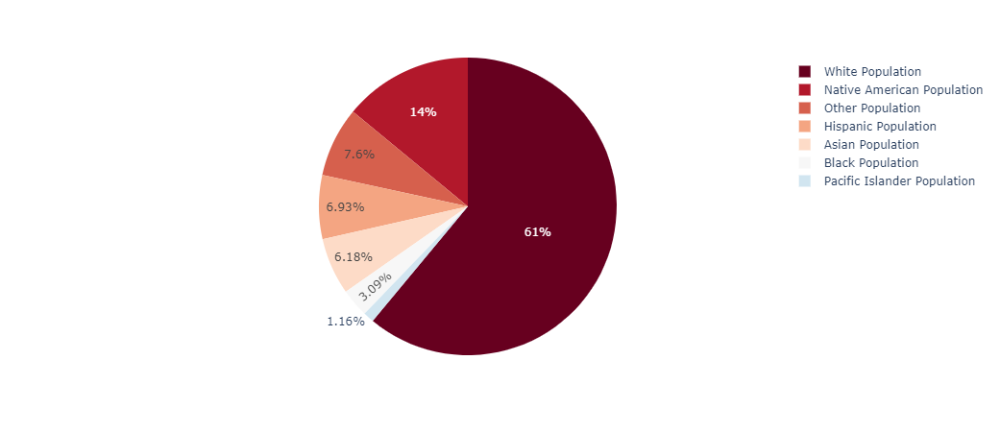

In [315]:
import plotly.express as px
fig = px.pie(state_info, values='AK', names='index', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [334]:
us_pop = pd.read_csv('state_info.csv', index_col=[0])

In [321]:
us_pop

,State,State Abbreviation,Total Population,Black Population,Hispanic Population,Native American Population,Asian Population,Pacific Islander Population,White Population,Other Population,Pop. Millions
0,Alabama,AL,4864680.0,1285737.0,203146.0,23243.0,63936.0,1521.0,3196730.0,90367.0,5.0
1,Alaska,AK,738516.0,22817.0,51186.0,103506.0,45617.0,8544.0,450754.0,56092.0,1.0
2,Arizona,AZ,6946685.0,286614.0,2163312.0,271946.0,222477.0,12523.0,3825886.0,163927.0,7.0
3,Arkansas,AR,2990671.0,458536.0,219052.0,17342.0,43441.0,7877.0,2173849.0,70574.0,3.0
4,California,CA,39148760.0,2164519.0,15221577.0,138427.0,5525439.0,138911.0,14695836.0,1264051.0,39.0
...,...,...,...,...,...,...,...,...,...,...,...
46,Virginia,VA,8413774.0,1582421.0,771177.0,17747.0,526973.0,4740.0,5233111.0,277605.0,8.0
47,Washington,WA,7294336.0,259482.0,911573.0,80274.0,602020.0,46476.0,5039208.0,355303.0,7.0
48,West Virginia,WV,1829054.0,65597.0,27522.0,3546.0,14353.0,309.0,1684756.0,32971.0,2.0
49,Wisconsin,WI,5778394.0,361909.0,385779.0,46149.0,158198.0,1676.0,4711038.0,113645.0,6.0


In [332]:
state_pop = pd.read_csv("State_info.csv")

In [324]:
state_pop["Black Population"].sum()

39715917.0

In [595]:
d = {
    "State":"US",
    "Black Population": state_info["Black Population"].sum(),
    "Hispanic Population": state_info["Black Population"].sum(),
    "Asian Population": state_info["Asian Population"].sum(),
    "Pacific Islander Population": state_info["Pacific Islander Population"].sum(),
    "White Population": state_info["White Population"].sum(),
    "Native American Population": state_info["Native American Population"].sum(),
    "Other Population": state_info["Other Population"].sum()
}

In [599]:
d2 = {}

In [600]:
df2 = pd.DataFrame(data=d2, index=[0])

In [605]:
df2.to_json()

'{}'

In [604]:
type(df2)

pandas.core.frame.DataFrame

In [356]:
d = {
    "State":"US",
    "GhosT": state_info["Black Population"].sum()}

In [355]:
state_info["Black Population"].sum()

39715917.0

In [358]:
df = pd.DataFrame(data=d, index=[0])

In [359]:
df

,State,Black Population,Hispanic Population,Asian Population,Pacific Islander Population,White Population,Native American Population,Other Population
0,US,39715917.0,39715917.0,17367169.0,525102.0,197181177.0,2135479.0,8460251.0


In [362]:
state = state_info.append(df)

In [375]:
state

,index,State,Black Population,Hispanic Population,Native American Population,Asian Population,Pacific Islander Population,White Population,Other Population
0,0,AL,1285737.0,203146.0,23243.0,63936.0,1521.0,3196730.0,90367.0
1,1,AK,22817.0,51186.0,103506.0,45617.0,8544.0,450754.0,56092.0
2,2,AZ,286614.0,2163312.0,271946.0,222477.0,12523.0,3825886.0,163927.0
3,3,AR,458536.0,219052.0,17342.0,43441.0,7877.0,2173849.0,70574.0
4,4,CA,2164519.0,15221577.0,138427.0,5525439.0,138911.0,14695836.0,1264051.0
...,...,...,...,...,...,...,...,...,...
47,47,WA,259482.0,911573.0,80274.0,602020.0,46476.0,5039208.0,355303.0
48,48,WV,65597.0,27522.0,3546.0,14353.0,309.0,1684756.0,32971.0
49,49,WI,361909.0,385779.0,46149.0,158198.0,1676.0,4711038.0,113645.0
50,50,WY,5149.0,56966.0,12717.0,4660.0,434.0,489559.0,12351.0


In [392]:
df = pd.read_csv("State_Country_Pop.csv")

In [404]:
df.columns = ['Demographics', 'AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC',
       'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD',
       'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
       'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT',
       'VT', 'VA', 'WA', 'WV', 'WI', 'WY', 'US']

In [413]:
def demographic_pie(df, user_input):
    fig = px.pie(df, values=user_input, names='Demographics', color_discrete_sequence=px.colors.qualitative.D3, title=f"Demographic of {user_input}")
    return fig.show()
    

In [418]:
df = pd.read_csv('State_Country_Pop.csv', index_col=[0])

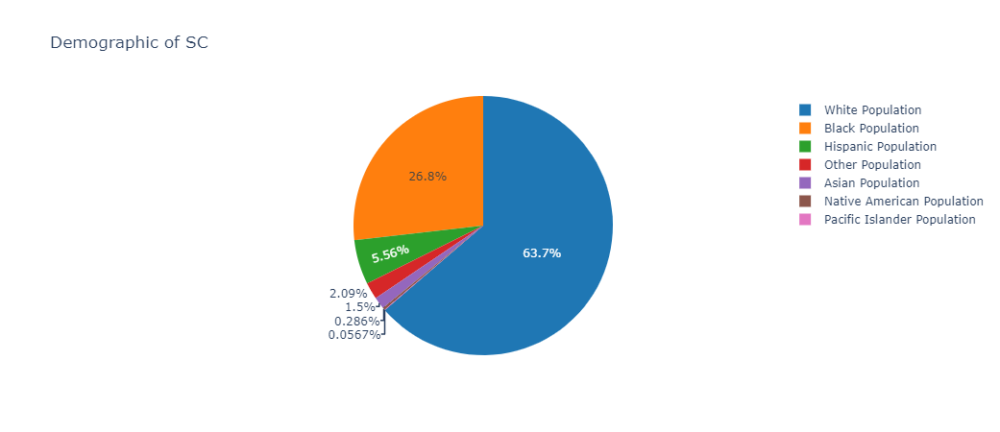

In [419]:
user_input = "SC"
demographic_pie(df, user_input)

In [369]:
state

,State,Black Population,Hispanic Population,Native American Population,Asian Population,Pacific Islander Population,White Population,Other Population
0,AL,1285737.0,203146.0,23243.0,63936.0,1521.0,3196730.0,90367.0
1,AK,22817.0,51186.0,103506.0,45617.0,8544.0,450754.0,56092.0
2,AZ,286614.0,2163312.0,271946.0,222477.0,12523.0,3825886.0,163927.0
3,AR,458536.0,219052.0,17342.0,43441.0,7877.0,2173849.0,70574.0
4,CA,2164519.0,15221577.0,138427.0,5525439.0,138911.0,14695836.0,1264051.0
...,...,...,...,...,...,...,...,...
47,WA,259482.0,911573.0,80274.0,602020.0,46476.0,5039208.0,355303.0
48,WV,65597.0,27522.0,3546.0,14353.0,309.0,1684756.0,32971.0
49,WI,361909.0,385779.0,46149.0,158198.0,1676.0,4711038.0,113645.0
50,WY,5149.0,56966.0,12717.0,4660.0,434.0,489559.0,12351.0


In [508]:
def pie_charts_vic(df, start_date:str, end_date:str, groupby, sort_by):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    
    if "National" in groupby:
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial'
                                        )])
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            {"Error": "invalid User inputs"}
        return fig.to_json()
    if "States" in groupby:
        df = df.loc[df['State'].isin(groupby["States"])]
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial',
                                        )])
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            return {"Error":"Invalid States Inputs"}
        return fig.to_json()         
    if "City" in groupby:
        df = df.loc[df['City_State'].isin(groupby["City"])]
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try: 
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial'
                                        )]) 
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            return {"Error":"Invalid States Inputs"}
        return fig.show()
    return "No Selection or invalid inputs"

In [509]:
df = pd.read_csv("final.csv", index_col=[0])

In [510]:
df.columns

Index(['Victim's name', 'Victim's age', 'Victim's gender', 'Victim's race',
       'URL of image of victim', 'Date of Incident (month/day/year)',
       'Street Address of Incident', 'City', 'State', 'Zipcode', 'County',
       'Agency responsible for death', 'ORI Agency Identifier (if available)',
       'Cause of death',
       'A brief description of the circumstances surrounding the death',
       'Official disposition of death (justified or other)',
       'Criminal Charges?',
       'Link to news article or photo of official document',
       'Symptoms of mental illness?', 'Unarmed/Did Not Have an Actual Weapon',
       'Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database)',
       'Alleged Threat Level (Source: WaPo)', 'Fleeing (Source: WaPo)',
       'Body Camera (Source: WaPo)', 'WaPo ID (If included in WaPo database)',
       'Off-Duty Killing?',
       'Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-co

In [511]:
df[df["Victim's gender"]== "Male "].index

Int64Index([39], dtype='int64')

In [480]:
df["Victim's gender"].replace("Male ", "Male", inplace=True)

In [100]:
df = pd.read_csv("final.csv", index_col=[0])

In [698]:
df.columns

Index(['Victim's name', 'Victim's age', 'Victim's gender', 'Victim's race',
       'URL of image of victim', 'Date of Incident (month/day/year)',
       'Street Address of Incident', 'City', 'State', 'Zipcode', 'County',
       'Agency responsible for death', 'ORI Agency Identifier (if available)',
       'Cause of death',
       'A brief description of the circumstances surrounding the death',
       'Official disposition of death (justified or other)',
       'Criminal Charges?',
       'Link to news article or photo of official document',
       'Symptoms of mental illness?', 'Unarmed/Did Not Have an Actual Weapon',
       'Alleged Weapon (Source: WaPo and Review of Cases Not Included in WaPo Database)',
       'Alleged Threat Level (Source: WaPo)', 'Fleeing (Source: WaPo)',
       'Body Camera (Source: WaPo)', 'WaPo ID (If included in WaPo database)',
       'Off-Duty Killing?',
       'Geography (via Trulia methodology based on zipcode population density: http://jedkolko.com/wp-co

In [729]:
df.columns = ['Victim\'s name', 'Victim\'s age', 'Victim\'s gender', 'Victim\'s race',
       'URL of image of victim', 'Date of Incident (month/day/year)',
       'Street Address of Incident', 'City', 'State', 'Zipcode', 'County',
       'Agency responsible for death', 'ORI Agency Identifier (if available)',
       'Cause of death',
       'A brief description of the circumstances surrounding the death',
       'Official disposition of death (justified or other)',
       'Criminal Charges?',
       'Link to news article or photo of official document',
       'Symptoms of mental illness?', 'Unarmed/Did Not Have an Actual Weapon',
       'Alleged Weapon',
       'Alleged Threat Level', 'Fleeing',
       'Body Camera', 'WaPo ID (If included in WaPo database)',
       'Off-Duty Killing?',
       'Geography',
       'MPV ID', 'Fatal Encounters ID', 'City_State', 'Adress', 'location',
       'point', 'lon', 'lat', 'month_year']

In [730]:
df.to_csv("final.csv")

In [732]:
df.columns

Index(['Victim's name', 'Victim's age', 'Victim's gender', 'Victim's race',
       'URL of image of victim', 'Date of Incident (month/day/year)',
       'Street Address of Incident', 'City', 'State', 'Zipcode', 'County',
       'Agency responsible for death', 'ORI Agency Identifier (if available)',
       'Cause of death',
       'A brief description of the circumstances surrounding the death',
       'Official disposition of death (justified or other)',
       'Criminal Charges?',
       'Link to news article or photo of official document',
       'Symptoms of mental illness?', 'Unarmed/Did Not Have an Actual Weapon',
       'Alleged Weapon', 'Alleged Threat Level', 'Fleeing', 'Body Camera',
       'WaPo ID (If included in WaPo database)', 'Off-Duty Killing?',
       'Geography', 'MPV ID', 'Fatal Encounters ID', 'City_State', 'Adress',
       'location', 'point', 'lon', 'lat', 'month_year'],
      dtype='object')

In [ ]:
"Geography", "Body Camera", "Alleged Threat Level", 'Symptoms of mental illness?', 'Unarmed/Did Not Have an Actual Weapon',
       'Alleged Weapon', "Victim's gender", "Victim's race"

In [101]:
def pie_charts_vic(df, start_date:str, end_date:str, groupby, sort_by, asc):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    
    if "National" in groupby:
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial'
                                        )])
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            {"Error": "invalid User inputs"}
        return fig.to_json()
    if "States" in groupby:
        df = df.loc[df['State'].isin(groupby["States"])]
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial',
                                        )])
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            return {"Error":"Invalid States Inputs"}
        return fig.to_json()         
    if "City" in groupby:
        df = df.loc[df['City_State'].isin(groupby["City"])]
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try: 
            fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label+percent',
                                        insidetextorientation='radial'
                                        )]) 
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            return {"Error":"Invalid States Inputs"}
        return fig.to_json()
    return "No Selection or invalid inputs"


In [102]:
start_date = "2011-01-24"
end_date = "2028-01-24"
groupby_nat = {"National":None}
groupby_st = {"States":["GA","FL","SC", "CA", "PA"]}
groupby_zip = {"Zipcode": [77414.0, 34614.0]}
groupby_cit = {"City": ["Emmitsburg, MD", 'Coram, NY', 'Tooele, UT']}
sort_by ="Victim's gender"

In [728]:
pie_charts_vic(df, start_date, end_date, groupby_nat, sort_by, asc)

'{"data":[{"insidetextorientation":"radial","labels":["Male ","Transgender","Unknown","Female","Male"],"textinfo":"label+percent","type":"pie","values":[0.00011737089201877934,0.001056338028169014,0.001995305164319249,0.04988262910798122,0.9469483568075118]}],"layout":{"font":{"color":"RebeccaPurple","family":"Courier New, monospace","size":12},"template":{"data":{"bar":[{"error_x":{"color":"#2a3f5f"},"error_y":{"color":"#2a3f5f"},"marker":{"line":{"color":"#E5ECF6","width":0.5}},"type":"bar"}],"barpolar":[{"marker":{"line":{"color":"#E5ECF6","width":0.5}},"type":"barpolar"}],"carpet":[{"aaxis":{"endlinecolor":"#2a3f5f","gridcolor":"white","linecolor":"white","minorgridcolor":"white","startlinecolor":"#2a3f5f"},"baxis":{"endlinecolor":"#2a3f5f","gridcolor":"white","linecolor":"white","minorgridcolor":"white","startlinecolor":"#2a3f5f"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type":"choropleth"}],"contour":[{"colorbar":{"outlinewidth":0,"ticks":""},"co

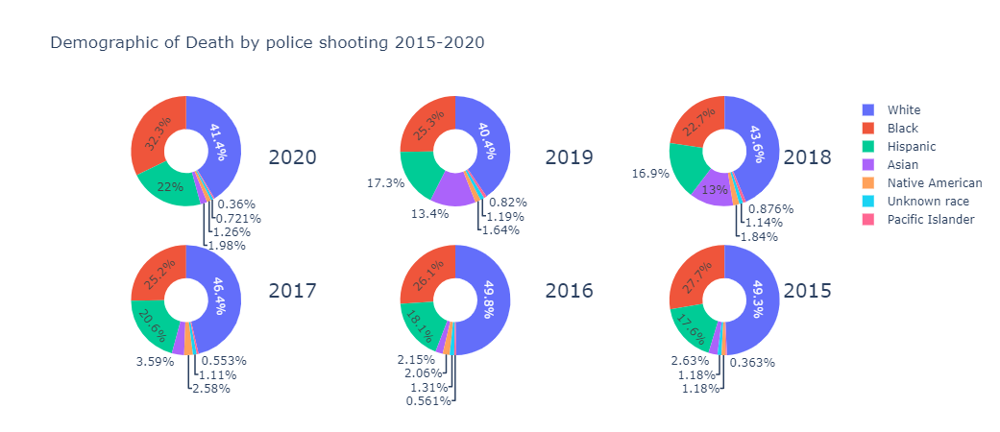

In [542]:
labels = df2015["Demographic"]
from plotly.subplots import make_subplots

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=2, cols=3, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}],[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=df2020['Percentage'], name="2020"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=df2019['Percentage'], name="2019"),
              1, 2)
fig.add_trace(go.Pie(labels=labels, values=df2018['Percentage'], name="2018"),
              1, 3)
fig.add_trace(go.Pie(labels=labels, values=df2017['Percentage'], name="2017"),
              2, 1)
fig.add_trace(go.Pie(labels=labels, values=df2016['Percentage'], name="2016"),
              2, 2)
fig.add_trace(go.Pie(labels=labels, values=df2015['Percentage'], name="2015"),
              2, 3)
# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Demographic of Death by police shooting 2015-2020",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='2020', x=0.25, y=0.82, font_size=20, showarrow=False),
                 dict(text='2019', x=0.65, y=0.82, font_size=20, showarrow=False),
                 dict(text='2015', x=1.0, y=0.2, font_size=20, showarrow=False),
                 dict(text='2017', x=0.25, y=0.2, font_size=20, showarrow=False),
                 dict(text='2016', x=0.65, y=0.2, font_size=20, showarrow=False),
                 dict(text='2018', x=1.0, y=0.82, font_size=20, showarrow=False)])
fig.show()

In [570]:
# Test inputs 
start_date = "2017-01-01"
end_date = "2028-01-24"
groupby_nat = {"National":True}
groupby_st = {"States":["GA","FL","SC", "CA", "PA"]}
groupby_zip = {"Zipcode": [77414.0, 34614.0]}
groupby_cit = {"City": ["Atlanta,GA"]}
asc = True

In [555]:
def bar_incident(df, start_date:str, end_date:str, groupby,asc=True):
    """
    This function serves to generate bar graphs that represent rate of deadly police shooting
    with filter that is determined by user inputs.
    
    The function can take in certian start and end_date and limit the data representation to those
    stated timeframes.
    
    This funcation can group the data set to show the graph represending user specific Zipcodes and States.
    """
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    
    if "National" in groupby:
        test_df = df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fig = px.bar(test_df, x="State", y="counts", title="Number of People killed by police Nationally", color="State")
        return fig.show()
    if "States" in groupby:
        test_df = df.loc[df["State"].isin(groupby["States"])]
        test_df = test_df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fig = px.bar(test_df, x="State", y="counts", title="Number of People killed by police in the Selected States", color="State")
        return fig.show()          
    if "Zipcode" in groupby:
        test_df = df.loc[df["Zipcode"].isin(groupby["Zipcode"])]
        test_df = test_df['Zipcode'].value_counts().sort_values(ascending=asc).rename_axis('Zipcode').reset_index(name='counts')
        test_df['Zipcode'] = test_df["Zipcode"].astype(int)
        test_df['Zipcode'] = test_df["Zipcode"].astype(str)
        fig = px.bar(test_df, x="Zipcode", y="counts", title="Number of People killed by police in the Zipcode", color="Zipcode")
        return fig.show()  
    if "City" in groupby:
        test_df = df.loc[df["CityState"].isin(groupby["City"])]
        test_df = test_df['CityState'].value_counts().sort_values(ascending=asc).rename_axis('CityState').reset_index(name='counts')
        fig = px.bar(test_df, x="CityState", y="counts", title="Number of People killed by police in the selected City", color="CityState")
        return fig.show()    
    
    return "No Selection or invalid inputs"

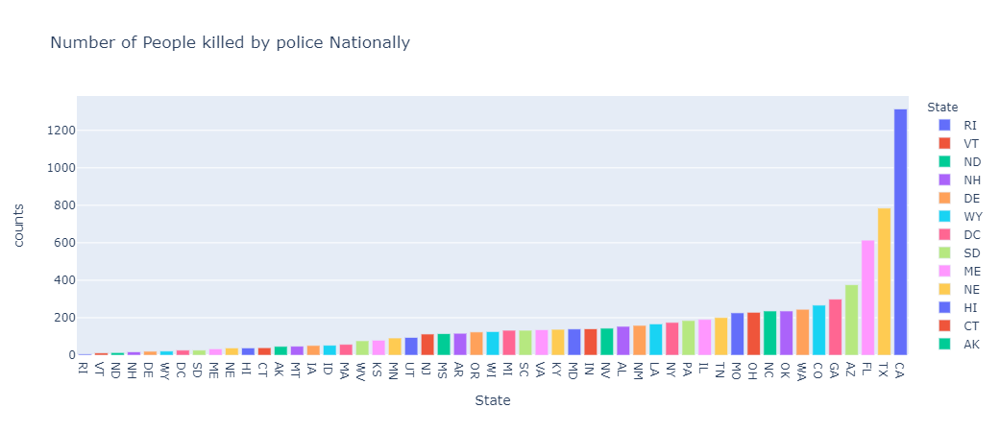

In [556]:
test_df = bar_incident(df, start_date, end_date, groupby_nat)

In [545]:
def map_function(df, start_date, end_date, sort_by:str= "Armed/Unarmed"):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    mapbox_access_token = 'pk.eyJ1IjoicG9wa2RvZGdlIiwiYSI6ImNrZDdvZDFtbDAwNmwycW9xazQycWpldTYifQ.33ELrqLko1a0dHHEkSsxNw'
    if sort_by == "Armed/Unarmed":
        color="Unarmed/Did Not Have an Actual Weapon"
    if sort_by == "Demographic":
        color="Victim's race"
    if sort_by == "Gender":
        color="Victim's gender"
    px.set_mapbox_access_token(mapbox_access_token)
    fig = px.scatter_mapbox(df,
                            lat=df.lon,
                            lon=df.lat,
                            zoom=1,
                            hover_name= "Victim's name",
                            hover_data= ['Victim\'s age','Victim\'s gender','Victim\'s race',"State","City"],
                            color = color,
                            title=f"Police Shooting Between {start_date} and {end_date}"
                           )
    fig.update_layout(mapbox_style="open-street-map",
                      mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
    return fig.show()

    

In [546]:
def demographic_pie(df, user_input):
    fig = px.pie(df, values=user_input, names='Demographics', color_discrete_sequence=px.colors.qualitative.D3, title=f"Demographic of {user_input}")
    return fig.show()

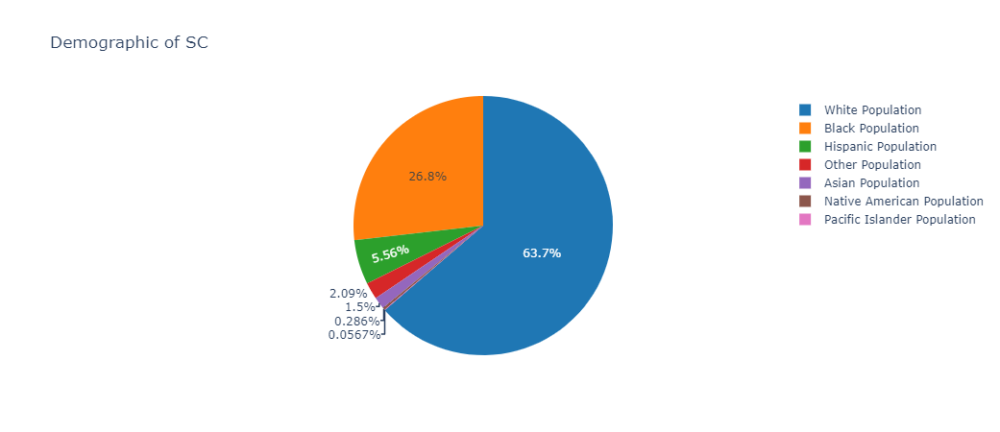

In [548]:
user_input = "SC"
st = pd.read_csv('State_Country_Pop.csv', index_col=[0])
demographic_pie(st, user_input)

In [594]:
st

,Demographics,AL,AK,AZ,AR,CA,CO,CT,DE,DC,FL,GA,HI,ID,IL,IN,IA,KS,KY,LA,ME,MD,MA,MI,MN,MS,MO,MT,NE,NV,NH,NJ,NM,NY,NC,ND,OH,OK,OR,PA,RI,SC,SD,TN,TX,UT,VT,VA,WA,WV,WI,WY,US
0,Black Population,1285737.0,22817.0,286614.0,458536.0,2164519.0,216732.0,351817.0,204665.0,315281.0,3167011.0,3195363.0,24472.0,10739.0,1796057.0,610343.0,107471.0,163713.0,349407.0,1492230.0,16990.0,1759438.0,463796.0,1360345.0,336505.0,1121752.0,699730.0,4348.0,88442.0,249967.0,17622.0,1129257.0,38016.0,2808679.0,2146254.0,20113.0,1418048.0,282622.0,74356.0,1360576.0,59001.0,1328352.0,15840.0,1107218.0,3269253.0,33713.0,7602.0,1582421.0,259482.0,65597.0,361909.0,5149.0,39715917.0
1,Hispanic Population,203146.0,51186.0,2163312.0,219052.0,15221577.0,1184794.0,561791.0,86315.0,74776.0,5184720.0,968463.0,147962.0,209073.0,2174842.0,450267.0,183296.0,340616.0,158744.0,234920.0,21421.0,588912.0,789127.0,497897.0,292764.0,90493.0,249105.0,39019.0,203281.0,831597.0,48356.0,1768020.0,1015751.0,3705588.0,935950.0,26529.0,431327.0,407521.0,523956.0,905156.0,158858.0,275685.0,31995.0,352402.0,10921556.0,422123.0,11677.0,771177.0,911573.0,27522.0,385779.0,56966.0,39715917.0
2,Native American Population,23243.0,103506.0,271946.0,17342.0,138427.0,30131.0,5320.0,2851.0,1314.0,41776.0,18416.0,1877.0,18775.0,15037.0,12125.0,9067.0,19504.0,8498.0,24014.0,7722.0,10949.0,8890.0,45772.0,53168.0,12990.0,23566.0,64643.0,13918.0,26355.0,1838.0,9599.0,183408.0,46139.0,111360.0,38308.0,17723.0,280638.0,36776.0,14419.0,3708.0,14187.0,72263.0,15172.0,68452.0,28047.0,1867.0,17747.0,80274.0,3546.0,46149.0,12717.0,2135479.0
3,Asian Population,63936.0,45617.0,222477.0,43441.0,5525439.0,169556.0,157406.0,36464.0,26278.0,548642.0,399223.0,522731.0,22809.0,685343.0,143883.0,74640.0,82887.0,62432.0,79137.0,14814.0,371981.0,440336.0,303059.0,260797.0,28170.0,115311.0,7806.0,43839.0,229928.0,35848.0,826944.0,29571.0,1616028.0,280059.0,10664.0,247987.0,82318.0,172505.0,424597.0,35128.0,74278.0,12540.0,112015.0,1292813.0,68747.0,10541.0,526973.0,602020.0,14353.0,158198.0,4660.0,17367169.0
4,Pacific Islander Population,1521.0,8544.0,12523.0,7877.0,138911.0,7480.0,752.0,276.0,280.0,10770.0,5070.0,132583.0,2348.0,3088.0,2133.0,2863.0,1827.0,2339.0,1154.0,258.0,2265.0,1698.0,2464.0,1799.0,654.0,6037.0,706.0,1091.0,17703.0,270.0,2255.0,1046.0,5591.0,5677.0,366.0,3055.0,3982.0,15301.0,2702.0,684.0,2812.0,236.0,3318.0,20381.0,26607.0,170.0,4740.0,46476.0,309.0,1676.0,434.0,525102.0
5,White Population,3196730.0,450754.0,3825886.0,2173849.0,14695836.0,3778212.0,2418696.0,595623.0,248057.0,11196857.0,5476441.0,314536.0,1387654.0,7894286.0,5275162.0,2695888.0,2214543.0,3764082.0,2744265.0,1244525.0,3084868.0,4930412.0,7489371.0,4438071.0,1696952.0,4848330.0,898953.0,1512314.0,1458093.0,1214547.0,4960005.0,788308.0,10959534.0,6433039.0,639477.0,9220638.0,2586110.0,3103557.0,9826865.0,767727.0,3156973.0,710810.0,4924145.0,11807263.0,2394238.0,581023.0,5233111.0,5039208.0,1684756.0,4711038.0,489559.0,197181177.0
6,Other Population,90367.0,56092.0,163927.0,70574.0,1264051.0,144236.0,85722.0,23301.0,18512.0,448363.0,234508.0,277868.0,36411.0,252844.0,143513.0,59274.0,85686.0,94702.0,87896.0,27083.0,185022.0,195934.0,258580.0,144254.0,37751.0,147983.0,26257.0,41875.0,109206.0,25141.0,185765.0,36334.0,476894.0,243285.0,16744.0,303101.0,274946.0,155492.0,256866.0,31505.0,103638.0,20605.0,136819.0,505477.0,71875.0,12097.0,277605.0,355303.0,32971.0,113645.0,12351.0,8460251.0


In [549]:
def map_function(df, start_date, end_date, sort_by:str= "Armed/Unarmed"):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    mapbox_access_token = 'pk.eyJ1IjoicG9wa2RvZGdlIiwiYSI6ImNrZDdvZDFtbDAwNmwycW9xazQycWpldTYifQ.33ELrqLko1a0dHHEkSsxNw'
    if sort_by == "Armed/Unarmed":
        color="Unarmed/Did Not Have an Actual Weapon"
    if sort_by == "Demographic":
        color="Victim's race"
    if sort_by == "Gender":
        color="Victim's gender"
    px.set_mapbox_access_token(mapbox_access_token)
    fig = px.scatter_mapbox(df,
                            lat=df.lon,
                            lon=df.lat,
                            zoom=1,
                            hover_name= "Victim's name",
                            hover_data= ['Victim\'s age','Victim\'s gender','Victim\'s race',"State","City"],
                            color = color,
                            title=f"Police Shooting Between {start_date} and {end_date}"
                           )
    fig.update_layout(mapbox_style="open-street-map",
                      mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
    return fig.show()    

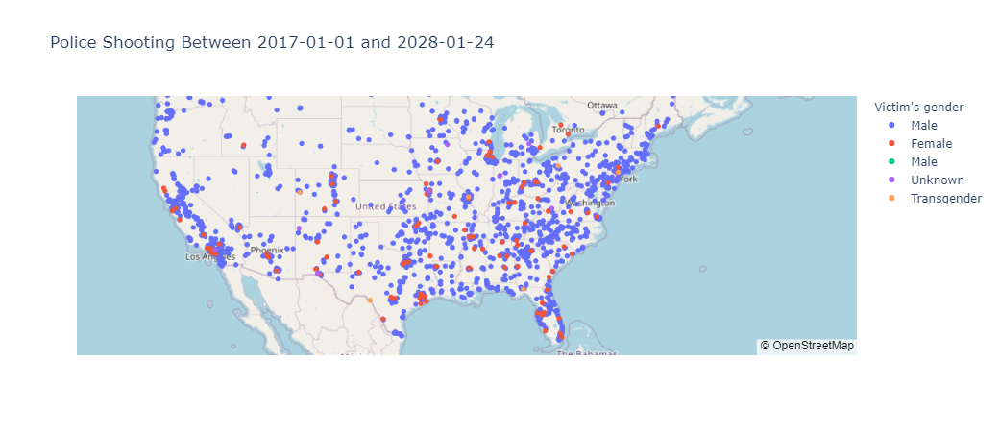

In [592]:
map_function(df, start_date, end_date,"Gender")

In [590]:

df = pd.read_csv('https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/final.csv', index_col=[0])
state_pop = pd.read_csv("https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/state_pop.csv", index_col=[0])

## Functions
def bar_incident(state_pop, df, start_date:str, end_date:str, groupby,asc=True):
    """
    This function serves to generate bar graphs that represent rate of deadly police shooting
    with filter that is determined by user inputs.
    
    The function can take in certian start and end_date and limit the data representation to those
    stated timeframes.
    
    This funcation can group the data set to show the graph represending user specific Zipcodes and States.
    """
    groupby = groupby
    state = state_pop.copy()
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    if "National" in groupby:
        test_df = df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fin = pd.merge(state_pop, test_df, how="inner", on="State")
        fin['count/popPermillions'] = round(fin["counts"]/fin["Pop. Millions"])
        fin = fin.sort_values(by="count/popPermillions")
        fig = px.bar(fin, x="State", y="count/popPermillions", title="Number of People killed by police in the Selected States", color="State")
        return fig.show()
    if "States" in groupby:
        test_df = df.loc[df["State"].isin(groupby["States"])]
        test_df = test_df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fin = pd.merge(state_pop, test_df, how="inner", on="State")
        fin['count/popPermillions'] = round(fin["counts"]/fin["Pop. Millions"])
        fin = fin.sort_values(by="count/popPermillions")
        fig = px.bar(fin, x="State", y="count/popPermillions", title="Number of People killed by police in the Selected States", color="State")
        return fig.show()          
    if "Zipcode" in groupby:
        test_df = df.loc[df["Zipcode"].isin(groupby["Zipcode"])]
        test_df = test_df['Zipcode'].value_counts().sort_values(ascending=asc).rename_axis('Zipcode').reset_index(name='counts')
        test_df['Zipcode'] = test_df["Zipcode"].astype(int)
        test_df['Zipcode'] = test_df["Zipcode"].astype(str)
        fig = px.bar(test_df, x="Zipcode", y="counts", title="Number of People killed by police in the Zipcode", color="Zipcode")
        return fig.show()  
    if "City" in groupby:
        test_df = df.loc[df["CityState"].isin(groupby["City"])]
        test_df = test_df['CityState'].value_counts().sort_values(ascending=asc).rename_axis('CityState').reset_index(name='counts')
        fig = px.bar(test_df, x="CityState", y="counts", title="Number of People killed by police in the selected City", color="CityState")
        return fig.show()    
    
    return "No Selection or invalid inputs"

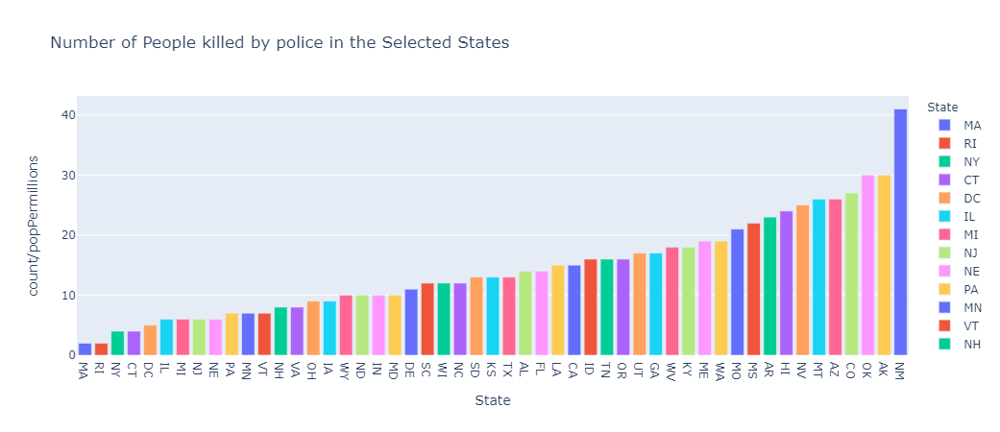

In [593]:
group_by = {"National":True}
bar_incident(state_pop, df, start_date, end_date, groupby_nat,asc)


In [617]:
def bar_incident(state_pop, df, start_date:str, end_date:str, groupby,asc=True):
    """
    This function serves to generate bar graphs that represent rate of deadly police shooting
    with filter that is determined by user inputs.
    
    The function can take in certian start and end_date and limit the data representation to those
    stated timeframes.
    
    This funcation can group the data set to show the graph represending user specific Zipcodes and States.
    """
    groupby = groupby
    state = state_pop.copy()
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    if "National" in groupby:
        test_df = df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fin = pd.merge(state_pop, test_df, how="inner", on="State")
        fin['count/popPermillions'] = round(fin["counts"]/fin["Pop. Millions"])
        fin = fin.sort_values(by="count/popPermillions")
        try:
            fig = px.bar(fin, x="State", y="count/popPermillions", title="Number of People killed by police in the Selected States", color="State")
        except:
            return {"Error": "Invalid inputs."}
        return fig.to_json()
    if "States" in groupby:
        test_df = df.loc[df["State"].isin(groupby["States"])]
        if test_df.to_json() == "{}":
            return {"Error":"Invalid user inputs"}
        test_df = test_df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fin = pd.merge(state_pop, test_df, how="inner", on="State")
        fin['count/popPermillions'] = round(fin["counts"]/fin["Pop. Millions"])
        fin = fin.sort_values(by="count/popPermillions")
        try:
            fig = px.bar(fin, x="State", y="count/popPermillions", title="Number of People killed by police in the Selected States", color="State")
        except:
            return {"Error": "No incident for the selected states"}
        return fig.to_json()          
    if "Zipcode" in groupby:
        test_df = df.loc[df["Zipcode"].isin(groupby["Zipcode"])]
        test_df = test_df['Zipcode'].value_counts().sort_values(ascending=asc).rename_axis('Zipcode').reset_index(name='counts')
        test_df['Zipcode'] = test_df["Zipcode"].astype(int)
        test_df['Zipcode'] = test_df["Zipcode"].astype(str)
        try:
            fig = px.bar(test_df, x="Zipcode", y="counts", title="Number of People killed by police in the Zipcode", color="Zipcode")
        except:
            return {"Error": "No incident for the selected zipcode"}
        return fig.to_json()  
    if "City" in groupby:
        test_df = df.loc[df["CityState"].isin(groupby["City"])]
        test_df = test_df['CityState'].value_counts().sort_values(ascending=asc).rename_axis('CityState').reset_index(name='counts')
        try:
            fig = px.bar(test_df, x="CityState", y="counts", title="Number of People killed by police in the selected City", color="CityState")
        except:
            return {"Error": "No incident for the selected City"}
        return fig.to_json()    
    
    return "No Selection or invalid inputs"


In [619]:
start_date = "2013-01-01"
end_date = "2025-01-01"

In [ ]:
df

In [612]:
groupby

{'National': ['CA']}

In [620]:
bar_incident(state_pop, df, start_date, end_date, groupby,asc=True)

'{"data":[{"alignmentgroup":"True","hovertemplate":"State=%{x}<br>count/popPermillions=%{y}<extra></extra>","legendgroup":"RI","marker":{"color":"#636efa"},"name":"RI","offsetgroup":"RI","orientation":"v","showlegend":true,"textposition":"auto","type":"bar","x":["RI"],"xaxis":"x","y":[6.0],"yaxis":"y"},{"alignmentgroup":"True","hovertemplate":"State=%{x}<br>count/popPermillions=%{y}<extra></extra>","legendgroup":"MA","marker":{"color":"#EF553B"},"name":"MA","offsetgroup":"MA","orientation":"v","showlegend":true,"textposition":"auto","type":"bar","x":["MA"],"xaxis":"x","y":[8.0],"yaxis":"y"},{"alignmentgroup":"True","hovertemplate":"State=%{x}<br>count/popPermillions=%{y}<extra></extra>","legendgroup":"NY","marker":{"color":"#00cc96"},"name":"NY","offsetgroup":"NY","orientation":"v","showlegend":true,"textposition":"auto","type":"bar","x":["NY"],"xaxis":"x","y":[9.0],"yaxis":"y"},{"alignmentgroup":"True","hovertemplate":"State=%{x}<br>count/popPermillions=%{y}<extra></extra>","legendgro

In [691]:
A= [[1,2,3],[4,5,6],[7,8,9]]

In [690]:
def rotate_matrix(A):
    size = len(A)
    g = {}
    for i in range(size):
        g[i] = []
    for row, array in enumerate(A):
        for index,col in enumerate(array):
            g[index].append(col)
    for i in range(size):
        g[i] = g[i][::-1]
    B = []
    for i in range(size):
        B.append(g[i])
    return B

In [687]:
for i in range(size):
    g[i] = g[i][::-1]

In [689]:
B = []
for i in range(size):
    B.append(g[i])

In [692]:
rotate_matrix(A)

[[7, 4, 1], [8, 5, 2], [9, 6, 3]]

In [640]:
i[::-1]

[7, 4, 1]

In [693]:
A = [[1,2,3,4],[5,6,7,8],[9,10,11,12],[13,14,15,16]]

In [694]:
rotate_matrix(A)

[[13, 9, 5, 1], [14, 10, 6, 2], [15, 11, 7, 3], [16, 12, 8, 4]]

In [213]:
df

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,...,Geography,MPV ID,Fatal Encounters ID,City_State,Adress,location,point,lon,lat,month_year
0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,NaN,Emmitsburg,MD,NaN,...,NaN,NaN,NaN,"Emmitsburg, MD","Emmitsburg, MD","Emmitsburg, Frederick County, Maryland, United...","39.7045417, -77.3269307, 0.0",39.704542,-77.326931,2020-10
1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,NaN,...,NaN,NaN,NaN,"Coram, NY","5306 Towne Woods Road Coram, NY","5306, Towne Woods Road, Coram, Suffolk County,...","40.87477914665149, -73.00924412825, 0.0",40.874779,-73.009244,2020-10
2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,NaN,South Milwaukee,WI,NaN,...,NaN,NaN,NaN,"South Milwaukee, WI","South Milwaukee, WI","South Milwaukee, Milwaukee County, Wisconsin, ...","42.9105722, -87.8606367, 0.0",42.910572,-87.860637,2020-10
3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,NaN,Tooele,UT,NaN,...,NaN,NaN,NaN,"Tooele, UT","Tooele, UT","Tooele County, Utah, United States of America","40.4062872, -113.1966394, 0.0",40.406287,-113.196639,2020-10
4,Gregory Putnik,32,Male,White,NaN,2020-10-18,NaN,Fresno,CA,NaN,...,NaN,NaN,NaN,"Fresno, CA","Fresno, CA","Fresno, Fresno County, California, United Stat...","36.7394421, -119.7848307, 0.0",36.739442,-119.784831,2020-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008.0,...,Suburban,4.0,12176.0,"Pueblo, CO","Highway 50 and North Elizabeth Street Pueblo, CO",NaN,NaN,NaN,NaN,2013-01
8516,Abel Gurrola,26,Male,Hispanic,http://www.bakersfieldnow.com/news/local/A-26-...,2013-01-01,720 Terrace Way,Bakersfield,CA,93304.0,...,Urban,3.0,12174.0,"Bakersfield, CA","720 Terrace Way Bakersfield, CA","720, Terrace Way, Kern, Bakersfield, Kern Coun...","35.3504178125, -119.01050393749999, 0.0",35.350418,-119.010504,2013-01
8517,Mark Chavez,49,Male,Hispanic,http://www.tricitytribuneusa.com/wp-content/up...,2013-01-01,912 Loma Linda Ave.,Farmington,NM,87401.0,...,Urban,1.0,12175.0,"Farmington, NM","912 Loma Linda Ave. Farmington, NM","912, Loma Linda Avenue, Farmington, San Juan C...","36.738734265380785, -108.201165, 0.0",36.738734,-108.201165,2013-01
8518,Andrew L. Closson,21,Male,White,http://www.superiortelegram.com/sites/default/...,2013-01-01,U.S. Highway 53,Gordon,WI,54838.0,...,Rural,5.0,12172.0,"Gordon, WI","U.S. Highway 53 Gordon, WI",NaN,NaN,NaN,NaN,2013-01


In [214]:
import pandas as pd
df = pd.read_csv("PoliceViolence.csv", index_col=[0])

In [215]:
df.dropna(inplace=True)

In [216]:
df.isnull().sum()

state        0
edit_at      0
city         0
name         0
date         0
date_text    0
id           0
Link1        0
location     0
geocode      0
point        0
lon          0
lat          0
dtype: int64

In [217]:
df = df.sort_values("date")

In [218]:
df.to_csv("PoliceViolence.csv")

In [235]:
df

,Unnamed: 0,state,edit_at,city,name,date,date_text,id,Link1,location,geocode,point,lon,lat
0,462,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Man has his gun confiscated in an open carry s...,2020-05-26,May 26th,mn-minneapolis-28,"<a href=""https://www.facebook.com/damicedsota....","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.063899,-93.249869
1,461,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police hit press in neck and head with wooden ...,2020-05-26,May 26th,mn-minneapolis-21,"<a href=""https://youtu.be/XAa5xb6JitI?t=5982"">...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.052399,-93.225969
2,463,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police shoot flashbang grenades into crowd,2020-05-26,believed to be May 26th or 27th,mn-minneapolis-14,"<a href=""https://www.facebook.com/1462345700/p...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.022999,-93.207069
3,554,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police make violent arrest at Union Square,2020-05-28,May 28th,ny-newyorkcity-56,"<a href=""https://twitter.com/NY1/status/126615...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.716828,-73.939915
4,149,Colorado,"<a href=""https://github.com/2020PB/police-brut...",Denver,Reporter shot with multiple pepper balls,2020-05-28,May 28th,co-denver-1,"<a href=""https://www.denverpost.com/2020/05/29...","Denver, Colorado","Denver, Denver County, Colorado, United States...","39.7392364, -104.9848623, 0.0",39.743636,-104.969162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,754,Washington,"<a href=""https://github.com/2020PB/police-brut...",Seattle,Police arrest bystander in vehicle,2020-11-04,November 4th,wa-seattle-75,"<a href=""https://twitter.com/onelung_/status/1...","Seattle, Washington","Seattle, King County, Washington, United State...","47.6038321, -122.3300624, 0.0",47.683932,-122.290162
1246,663,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,"Police kettle, assault, and arrest protesters",2020-11-04,November 4th,ny-newyorkcity-114,"<a href=""https://twitter.com/jangelooff/status...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.743728,-73.922115
1247,662,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police assault and arrest protesters,2020-11-04,November 4th,ny-newyorkcity-113,"<a href=""https://twitter.com/protest_nyc/statu...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.804528,-73.924515
1248,1248,Oregon,"<a href=""https://github.com/2020PB/police-brut...",Portland,Officers make violent arrests,2020-11-04,November 4th,or-portland-406,"<a href=""https://twitter.com/TheRealCoryElia/s...","Portland, Oregon","Portland, Metro, Multnomah County, Oregon, Uni...","45.5202471, -122.6741949, 0.0",45.544947,-122.616495


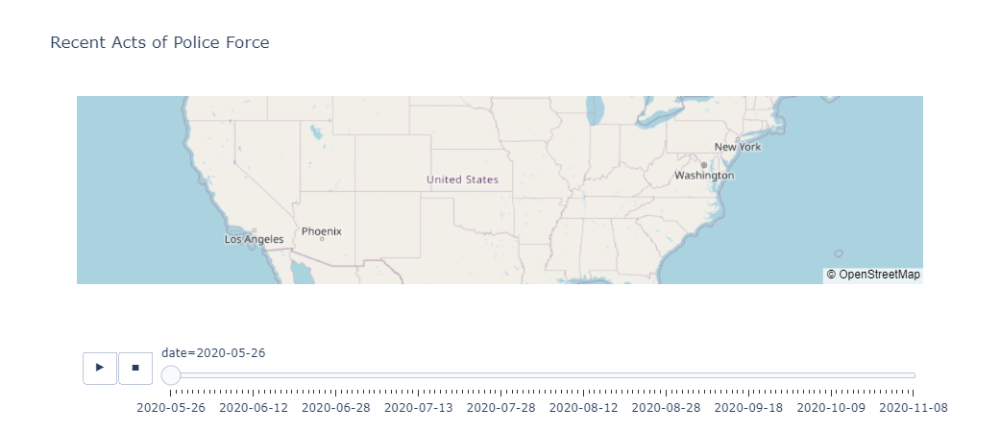

In [238]:
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px

mapbox_access_token = 'pk.eyJ1IjoicG9wa2RvZGdlIiwiYSI6ImNrZDdvZDFtbDAwNmwycW9xazQycWpldTYifQ.33ELrqLko1a0dHHEkSsxNw'
px.set_mapbox_access_token(mapbox_access_token)
lin = "Link1"
fig = px.scatter_mapbox(df,
                        lat=df.lon,
                        lon=df.lat,
                        zoom=1,
                        hover_name= "name",
                        hover_data = ['Link1'],
                        animation_frame="date", animation_group="name",
                        title="Recent Acts of Police Force",
                       )
fig.update_layout(mapbox_style="open-street-map",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
fig.show()

In [ ]:
def recent_pb(link, num_o_events=30):
  df = pd.read_csv(link)
  df = df.sort_values(by='date', ascending=False).head(num_o_events)
  df.columns = ['state', 'edit_at', 'city', 'name', 'date', 'date_text', 
                'id', 'Link1', 'Link2', 'Link3', 'Link4', 'Link5', 
                'Link6', 'Link7', 'Link8', 'Link9', 'Link10', 'Link11', 
                'Link12', 'Link13', 'Link14', 'Link15', 'Link16', 'Link17', 
                'Link18', 'Link19', 'Link20', 'Link21', 'Link22', 'Link23', 
                'Link24']
  df = df[['state', 'edit_at', 'city', 'name', 'date', 'date_text', 
           'id', 'Link1']]
  def anchor_tag(url):
    return f'<a href="{url}">{url}</a'
  df['Link1'] = df['Link1'].apply(anchor_tag)
  df['edit_at'] = df['edit_at'].apply(anchor_tag)
  df['location'] = df['city'] + ", " + df['state']
  geopy.geocoders.options.default_user_agent = "PlaceFinder"
  geolocator = Nominatim()
  geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1/20)
  df['geocode'] = df['location'].apply(geocode)
  df['point'] = df['geocode'].apply(lambda loc: tuple(loc.point) if loc else None)
  df['point'] = df.point.astype(str)
  df.point = df.point.str.rstrip(")")
  df.point = df.point.str.lstrip("(")
  df.point.dropna(inplace=True)
  new = df.point.str.split(",", expand=True)
  df['lon'] = new[0]
  df['lat'] = new[1]
  df['lon'] = df.lon.astype(float)
  df['lat'] = df.lat.astype(float)
  df = df[['location', 'name', 'date', 'id', 'Link1', 'lon', 'lat']]
  def randomize(flt):
    x = flt + (round(0.0001 * random.randrange(0,999), 6))
    return x
  df['lat'] = df['lat'].apply(randomize)
  df['lon'] = df['lon'].apply(randomize)
  mapbox_access_token = 'pk.eyJ1IjoicG9wa2RvZGdlIiwiYSI6ImNrZDdvZDFtbDAwNmwycW9xazQycWpldTYifQ.33ELrqLko1a0dHHEkSsxNw'
  px.set_mapbox_access_token(mapbox_access_token)
  fig = px.scatter_mapbox(df,
                        lat=df.lon,
                        lon=df.lat,
                        zoom=1,
                        hover_name= "name",
                        hover_data = ['Link1'],
                        color="date",
                        title=f"Recent Acts of Police Force"
                       )
  fig.update_yaxes(automargin=True)
  fig.update_xaxes(automargin=True)
  fig.update_layout(mapbox_style="open-street-map",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})

  return fig.to_json()


In [60]:
import random
def randomize(flt):
  x = flt + (round(0.0001 * random.randrange(-999,999), 6))
  return x

In [25]:
df['lat'] = df['lat'].apply(randomize)
df['lon'] = df['lon'].apply(randomize)

In [68]:
df["events"] = 1

In [72]:
num_events = df.groupby("date").agg({'events' : ['sum']})

In [223]:
num_events.to_csv("events.csv")

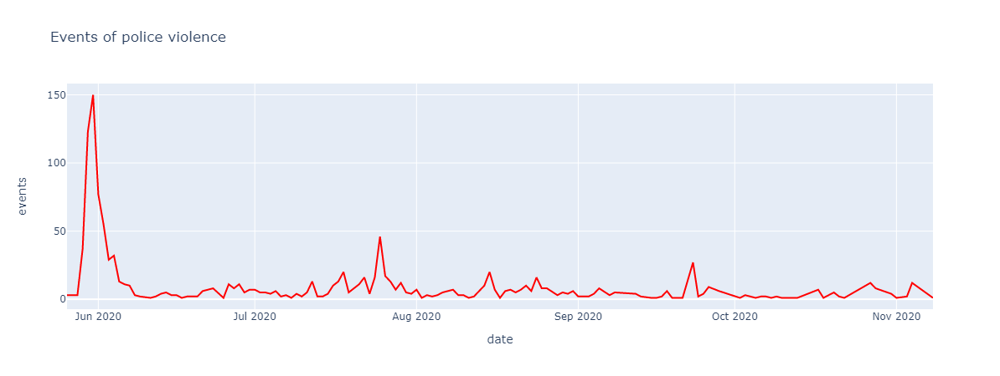

In [98]:
import plotly.express as px

fig = px.line(num_events,
              x="date",
              y="events",
              title='Events of police violence',
              color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"])
fig.show()

In [79]:
num_events = num_events.reset_index()

In [83]:
num_events.columns = ["date",
            "events"]

In [4]:
start_date = "2011-01-24"
end_date = "2028-01-24"
groupby_nat = {"National":None}
groupby_st = {"States":["GA","FL","SC", "CA", "PA"]}
groupby_zip = {"Zipcode": [77414.0, 34614.0]}
groupby_cit = {"City": ["Emmitsburg, MD", 'Coram, NY', 'Tooele, UT']}
sort_by ="Victim's race"

In [127]:
def demographic_pie(df, user_input):
    fig = px.pie(df, values=user_input, names='Demographics', 
                 color="Demographics",
                 color_discrete_map={
                "Black Population": "#636EFA",
                "Hispanic Population": "#EF553B",
                "Native American Population": "#00CC96",
                "Asian Population": "#AB63FA",
                "Pacific Islander Population": "#FFA15A",
                "White Population":"#19D3F3",
                "Other Population": "#FF6692"}
                 , title=f"Demographic of {user_input}")
    fig.update_yaxes(automargin=True)
    fig.update_xaxes(automargin=True)
    
    return fig.show()


In [128]:
usa = pd.read_csv('https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/State_Country_Pop.csv', index_col=[0])

In [129]:
    usa.Demographics

0               Black Population
1            Hispanic Population
2     Native American Population
3               Asian Population
4    Pacific Islander Population
5               White Population
6               Other Population
Name: Demographics, dtype: object

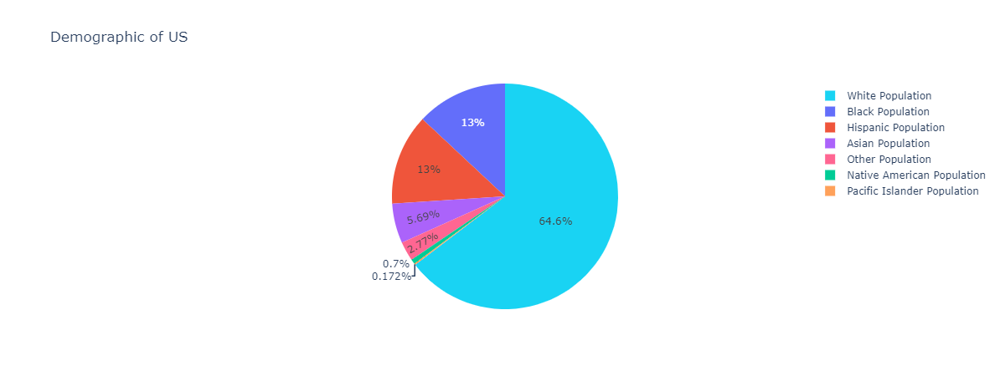

In [130]:
demographic_pie(usa, "US")

In [143]:
df["Victim\'s race"].value_counts()

White               3740
Black               2140
Hispanic            1467
Unknown race         875
Asian                131
Native American      119
Pacific Islander      46
Unknown                2
Name: Victim's race, dtype: int64

In [203]:
def pie_charts_vic(df, st_date:str, end_date:str, groupby, sort_by, asc):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    
    if "National" in groupby:
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = px.pie(df, values=values, names= labels, color=labels,
                         color_discrete_map={
                "Black": "#636EFA",
                "Hispanic": "#EF553B",
                "Native American": "#00CC96",
                "Asian": "#AB63FA",
                "Pacific Islander": "#FFA15A",
                "White":"#19D3F3",
                "Other": "#FF6692"})
            fig.update_yaxes(automargin=True)
            fig.update_xaxes(automargin=True)
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            {"Error": "invalid User inputs"}
        return fig.show()

In [204]:
df = pd.read_csv("https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/final.csv" ,index_col=[0])

In [210]:
def pie_charts_vic(df, start_date:str, end_date:str, groupby, sort_by, asc):
    # Selection of timeframes
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    
    if "National" in groupby:
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = px.pie(df, values=values, names= labels, color=labels,
                         color_discrete_map={
                "Black": "#636EFA",
                "Hispanic": "#EF553B",
                "Native American": "#00CC96",
                "Asian": "#AB63FA",
                "Pacific Islander": "#FFA15A",
                "White":"#19D3F3",
                "Other": "#FF6692"})
            fig.update_yaxes(automargin=True)
            fig.update_xaxes(automargin=True)
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            {"Error": "invalid User inputs"}
        return fig.to_json()
    if "States" in groupby:
        df = df.loc[df['State'].isin(groupby["States"])]
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = px.pie(df, values=values, names= labels, color=labels,
                         color_discrete_map={
                "Black": "#636EFA",
                "Hispanic": "#EF553B",
                "Native American": "#00CC96",
                "Asian": "#AB63FA",
                "Pacific Islander": "#FFA15A",
                "White":"#19D3F3",
                "Other": "#FF6692"})
            fig.update_yaxes(automargin=True)
            fig.update_xaxes(automargin=True)
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            return {"Error":"Invalid States Inputs"}
        return fig.to_json()         
    if "City" in groupby:
        df = df.loc[df['City_State'].isin(groupby["City"])]
        df = df[sort_by].value_counts(10).sort_values(ascending=asc).rename_axis(sort_by).reset_index(name='Percentage')
        labels = df[sort_by]
        values = df["Percentage"]
        try:
            fig = px.pie(df, values=values, names= labels, color=labels,
                         color_discrete_map={
                "Black": "#636EFA",
                "Hispanic": "#EF553B",
                "Native American": "#00CC96",
                "Asian": "#AB63FA",
                "Pacific Islander": "#FFA15A",
                "White":"#19D3F3",
                "Other": "#FF6692"})
            fig.update_yaxes(automargin=True)
            fig.update_xaxes(automargin=True)
            fig.update_layout(
                title=f"Percent of {sort_by}",
                xaxis_title="X Axis Title",
                yaxis_title="X Axis Title",
                font=dict(
                    family="Courier New, monospace",
                    size=12,
                    color="RebeccaPurple"))
        except:
            return {"Error":"Invalid States Inputs"}
        return fig.to_json()
    return "No Selection or invalid inputs"

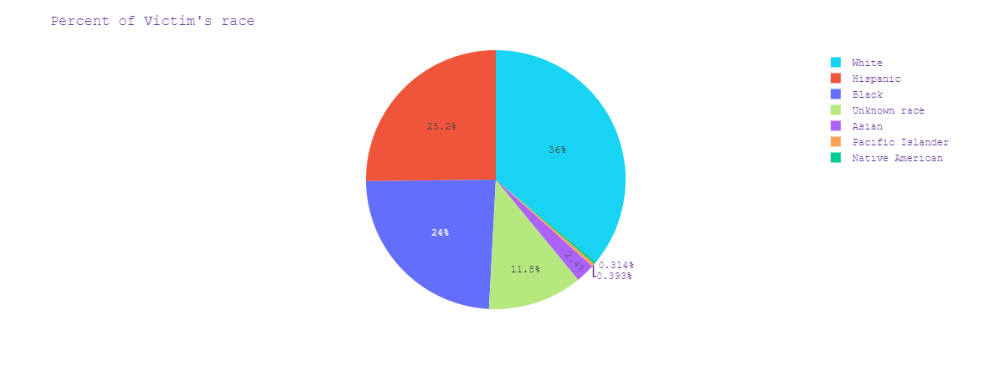

In [212]:
pie_charts_vic(df, start_date, end_date, groupby_st, sort_by, True)

In [201]:
df

,Victim's name,Victim's age,Victim's gender,Victim's race,URL of image of victim,Date of Incident (month/day/year),Street Address of Incident,City,State,Zipcode,...,Geography,MPV ID,Fatal Encounters ID,City_State,Adress,location,point,lon,lat,month_year
0,Bryan Selmer,NaN,Male,Unknown race,NaN,2020-10-19,NaN,Emmitsburg,MD,NaN,...,NaN,NaN,NaN,"Emmitsburg, MD","Emmitsburg, MD","Emmitsburg, Frederick County, Maryland, United...","39.7045417, -77.3269307, 0.0",39.704542,-77.326931,2020-10
1,Paul Sulkowski,46,Male,Unknown race,NaN,2020-10-19,5306 Towne Woods Road,Coram,NY,NaN,...,NaN,NaN,NaN,"Coram, NY","5306 Towne Woods Road Coram, NY","5306, Towne Woods Road, Coram, Suffolk County,...","40.87477914665149, -73.00924412825, 0.0",40.874779,-73.009244,2020-10
2,Name withheld by police,43,Male,Unknown race,NaN,2020-10-19,NaN,South Milwaukee,WI,NaN,...,NaN,NaN,NaN,"South Milwaukee, WI","South Milwaukee, WI","South Milwaukee, Milwaukee County, Wisconsin, ...","42.9105722, -87.8606367, 0.0",42.910572,-87.860637,2020-10
3,Tutuila Pine Koonwaiyou,37,Male,Unknown race,NaN,2020-10-18,NaN,Tooele,UT,NaN,...,NaN,NaN,NaN,"Tooele, UT","Tooele, UT","Tooele County, Utah, United States of America","40.4062872, -113.1966394, 0.0",40.406287,-113.196639,2020-10
4,Gregory Putnik,32,Male,White,NaN,2020-10-18,NaN,Fresno,CA,NaN,...,NaN,NaN,NaN,"Fresno, CA","Fresno, CA","Fresno, Fresno County, California, United Stat...","36.7394421, -119.7848307, 0.0",36.739442,-119.784831,2020-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8515,Christopher Tavares,21,Male,Hispanic,http://www.krdo.com/image/view/-/17980228/medR...,2013-01-01,Highway 50 and North Elizabeth Street,Pueblo,CO,81008.0,...,Suburban,4.0,12176.0,"Pueblo, CO","Highway 50 and North Elizabeth Street Pueblo, CO",NaN,NaN,NaN,NaN,2013-01
8516,Abel Gurrola,26,Male,Hispanic,http://www.bakersfieldnow.com/news/local/A-26-...,2013-01-01,720 Terrace Way,Bakersfield,CA,93304.0,...,Urban,3.0,12174.0,"Bakersfield, CA","720 Terrace Way Bakersfield, CA","720, Terrace Way, Kern, Bakersfield, Kern Coun...","35.3504178125, -119.01050393749999, 0.0",35.350418,-119.010504,2013-01
8517,Mark Chavez,49,Male,Hispanic,http://www.tricitytribuneusa.com/wp-content/up...,2013-01-01,912 Loma Linda Ave.,Farmington,NM,87401.0,...,Urban,1.0,12175.0,"Farmington, NM","912 Loma Linda Ave. Farmington, NM","912, Loma Linda Avenue, Farmington, San Juan C...","36.738734265380785, -108.201165, 0.0",36.738734,-108.201165,2013-01
8518,Andrew L. Closson,21,Male,White,http://www.superiortelegram.com/sites/default/...,2013-01-01,U.S. Highway 53,Gordon,WI,54838.0,...,Rural,5.0,12172.0,"Gordon, WI","U.S. Highway 53 Gordon, WI",NaN,NaN,NaN,NaN,2013-01


In [229]:
def randomize(flt):
    x = flt + (round(0.0001 * random.randrange(0,999), 6))
    return x
df['lat'] = df['lat'].apply(randomize)
df['lon'] = df['lon'].apply(randomize)

In [230]:
df.to_csv

,Unnamed: 0,state,edit_at,city,name,date,date_text,id,Link1,location,geocode,point,lon,lat
0,462,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Man has his gun confiscated in an open carry s...,2020-05-26,May 26th,mn-minneapolis-28,"<a href=""https://www.facebook.com/damicedsota....","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.063899,-93.249869
1,461,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police hit press in neck and head with wooden ...,2020-05-26,May 26th,mn-minneapolis-21,"<a href=""https://youtu.be/XAa5xb6JitI?t=5982"">...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.052399,-93.225969
2,463,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police shoot flashbang grenades into crowd,2020-05-26,believed to be May 26th or 27th,mn-minneapolis-14,"<a href=""https://www.facebook.com/1462345700/p...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.022999,-93.207069
3,554,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police make violent arrest at Union Square,2020-05-28,May 28th,ny-newyorkcity-56,"<a href=""https://twitter.com/NY1/status/126615...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.716828,-73.939915
4,149,Colorado,"<a href=""https://github.com/2020PB/police-brut...",Denver,Reporter shot with multiple pepper balls,2020-05-28,May 28th,co-denver-1,"<a href=""https://www.denverpost.com/2020/05/29...","Denver, Colorado","Denver, Denver County, Colorado, United States...","39.7392364, -104.9848623, 0.0",39.743636,-104.969162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,754,Washington,"<a href=""https://github.com/2020PB/police-brut...",Seattle,Police arrest bystander in vehicle,2020-11-04,November 4th,wa-seattle-75,"<a href=""https://twitter.com/onelung_/status/1...","Seattle, Washington","Seattle, King County, Washington, United State...","47.6038321, -122.3300624, 0.0",47.683932,-122.290162
1246,663,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,"Police kettle, assault, and arrest protesters",2020-11-04,November 4th,ny-newyorkcity-114,"<a href=""https://twitter.com/jangelooff/status...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.743728,-73.922115
1247,662,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police assault and arrest protesters,2020-11-04,November 4th,ny-newyorkcity-113,"<a href=""https://twitter.com/protest_nyc/statu...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.804528,-73.924515
1248,1248,Oregon,"<a href=""https://github.com/2020PB/police-brut...",Portland,Officers make violent arrests,2020-11-04,November 4th,or-portland-406,"<a href=""https://twitter.com/TheRealCoryElia/s...","Portland, Oregon","Portland, Metro, Multnomah County, Oregon, Uni...","45.5202471, -122.6741949, 0.0",45.544947,-122.616495


In [228]:
link = 'https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/PoliceViolence.csv'
df = pd.read_csv(link)
df

,Unnamed: 0,state,edit_at,city,name,date,date_text,id,Link1,location,geocode,point,lon,lat
0,462,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Man has his gun confiscated in an open carry s...,2020-05-26,May 26th,mn-minneapolis-28,"<a href=""https://www.facebook.com/damicedsota....","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",44.977300,-93.265469
1,461,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police hit press in neck and head with wooden ...,2020-05-26,May 26th,mn-minneapolis-21,"<a href=""https://youtu.be/XAa5xb6JitI?t=5982"">...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",44.977300,-93.265469
2,463,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police shoot flashbang grenades into crowd,2020-05-26,believed to be May 26th or 27th,mn-minneapolis-14,"<a href=""https://www.facebook.com/1462345700/p...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",44.977300,-93.265469
3,554,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police make violent arrest at Union Square,2020-05-28,May 28th,ny-newyorkcity-56,"<a href=""https://twitter.com/NY1/status/126615...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.712728,-74.006015
4,149,Colorado,"<a href=""https://github.com/2020PB/police-brut...",Denver,Reporter shot with multiple pepper balls,2020-05-28,May 28th,co-denver-1,"<a href=""https://www.denverpost.com/2020/05/29...","Denver, Colorado","Denver, Denver County, Colorado, United States...","39.7392364, -104.9848623, 0.0",39.739236,-104.984862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,754,Washington,"<a href=""https://github.com/2020PB/police-brut...",Seattle,Police arrest bystander in vehicle,2020-11-04,November 4th,wa-seattle-75,"<a href=""https://twitter.com/onelung_/status/1...","Seattle, Washington","Seattle, King County, Washington, United State...","47.6038321, -122.3300624, 0.0",47.603832,-122.330062
1246,663,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,"Police kettle, assault, and arrest protesters",2020-11-04,November 4th,ny-newyorkcity-114,"<a href=""https://twitter.com/jangelooff/status...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.712728,-74.006015
1247,662,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police assault and arrest protesters,2020-11-04,November 4th,ny-newyorkcity-113,"<a href=""https://twitter.com/protest_nyc/statu...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.712728,-74.006015
1248,1248,Oregon,"<a href=""https://github.com/2020PB/police-brut...",Portland,Officers make violent arrests,2020-11-04,November 4th,or-portland-406,"<a href=""https://twitter.com/TheRealCoryElia/s...","Portland, Oregon","Portland, Metro, Multnomah County, Oregon, Uni...","45.5202471, -122.6741949, 0.0",45.520247,-122.674195


In [233]:
df

,Unnamed: 0,state,edit_at,city,name,date,date_text,id,Link1,location,geocode,point,lon,lat
0,462,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Man has his gun confiscated in an open carry s...,2020-05-26,May 26th,mn-minneapolis-28,"<a href=""https://www.facebook.com/damicedsota....","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.063899,-93.249869
1,461,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police hit press in neck and head with wooden ...,2020-05-26,May 26th,mn-minneapolis-21,"<a href=""https://youtu.be/XAa5xb6JitI?t=5982"">...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.052399,-93.225969
2,463,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police shoot flashbang grenades into crowd,2020-05-26,believed to be May 26th or 27th,mn-minneapolis-14,"<a href=""https://www.facebook.com/1462345700/p...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",45.022999,-93.207069
3,554,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police make violent arrest at Union Square,2020-05-28,May 28th,ny-newyorkcity-56,"<a href=""https://twitter.com/NY1/status/126615...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.716828,-73.939915
4,149,Colorado,"<a href=""https://github.com/2020PB/police-brut...",Denver,Reporter shot with multiple pepper balls,2020-05-28,May 28th,co-denver-1,"<a href=""https://www.denverpost.com/2020/05/29...","Denver, Colorado","Denver, Denver County, Colorado, United States...","39.7392364, -104.9848623, 0.0",39.743636,-104.969162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,754,Washington,"<a href=""https://github.com/2020PB/police-brut...",Seattle,Police arrest bystander in vehicle,2020-11-04,November 4th,wa-seattle-75,"<a href=""https://twitter.com/onelung_/status/1...","Seattle, Washington","Seattle, King County, Washington, United State...","47.6038321, -122.3300624, 0.0",47.683932,-122.290162
1246,663,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,"Police kettle, assault, and arrest protesters",2020-11-04,November 4th,ny-newyorkcity-114,"<a href=""https://twitter.com/jangelooff/status...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.743728,-73.922115
1247,662,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police assault and arrest protesters,2020-11-04,November 4th,ny-newyorkcity-113,"<a href=""https://twitter.com/protest_nyc/statu...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.804528,-73.924515
1248,1248,Oregon,"<a href=""https://github.com/2020PB/police-brut...",Portland,Officers make violent arrests,2020-11-04,November 4th,or-portland-406,"<a href=""https://twitter.com/TheRealCoryElia/s...","Portland, Oregon","Portland, Metro, Multnomah County, Oregon, Uni...","45.5202471, -122.6741949, 0.0",45.544947,-122.616495


In [231]:
def PoliceViolence_map():
  link = 'https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/PoliceViolence.csv'
  df = pd.read_csv(link)
  mapbox_access_token = 'pk.eyJ1IjoicG9wa2RvZGdlIiwiYSI6ImNrZDdvZDFtbDAwNmwycW9xazQycWpldTYifQ.33ELrqLko1a0dHHEkSsxNw'
  px.set_mapbox_access_token(mapbox_access_token)
  fig = px.scatter_mapbox(df,
                          lat=df.lon,
                          lon=df.lat,
                          zoom=1,
                          hover_name= "name",
                          hover_data = ['Link1',],
                          animation_frame="date", animation_group="name",
                          color_discrete_sequence=["red", "green", "blue", "goldenrod", "magenta"],
                          title="Recent Acts of Police Force",
                        )
  fig.update_yaxes(automargin=True)
  fig.update_xaxes(automargin=True)
  fig.update_layout(mapbox_style="open-street-map",
                    mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
  return fig.show()

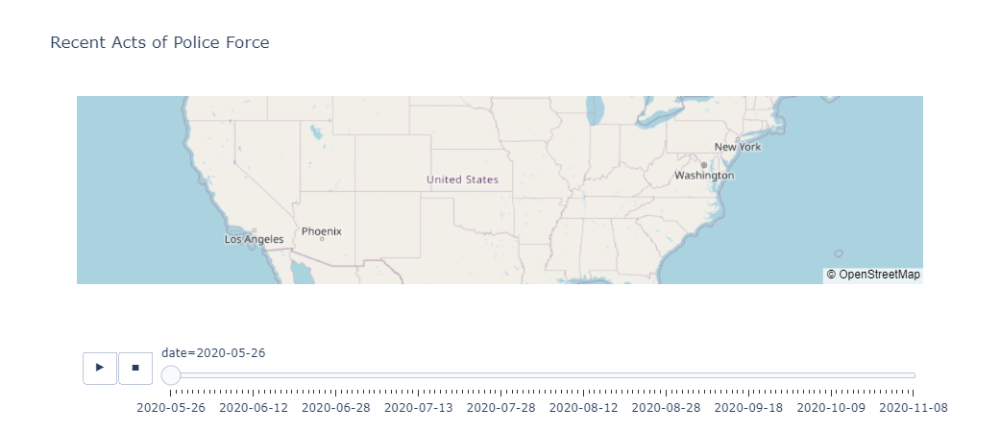

In [232]:
PoliceViolence_map()

In [239]:
df = pd.read_csv("PoliceViolence.csv", index_col=[0])

In [243]:
df

,state,edit_at,city,name,date,date_text,id,Link1,location,geocode,point,lon,lat
462,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Man has his gun confiscated in an open carry s...,2020-05-26,May 26th,mn-minneapolis-28,"<a href=""https://www.facebook.com/damicedsota....","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",44.977300,-93.265469
461,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police hit press in neck and head with wooden ...,2020-05-26,May 26th,mn-minneapolis-21,"<a href=""https://youtu.be/XAa5xb6JitI?t=5982"">...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",44.977300,-93.265469
463,Minnesota,"<a href=""https://github.com/2020PB/police-brut...",Minneapolis,Police shoot flashbang grenades into crowd,2020-05-26,believed to be May 26th or 27th,mn-minneapolis-14,"<a href=""https://www.facebook.com/1462345700/p...","Minneapolis, Minnesota","Minneapolis, Hennepin County, Minnesota, Unite...","44.9772995, -93.2654692, 0.0",44.977300,-93.265469
554,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police make violent arrest at Union Square,2020-05-28,May 28th,ny-newyorkcity-56,"<a href=""https://twitter.com/NY1/status/126615...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.712728,-74.006015
149,Colorado,"<a href=""https://github.com/2020PB/police-brut...",Denver,Reporter shot with multiple pepper balls,2020-05-28,May 28th,co-denver-1,"<a href=""https://www.denverpost.com/2020/05/29...","Denver, Colorado","Denver, Denver County, Colorado, United States...","39.7392364, -104.9848623, 0.0",39.739236,-104.984862
...,...,...,...,...,...,...,...,...,...,...,...,...,...
754,Washington,"<a href=""https://github.com/2020PB/police-brut...",Seattle,Police arrest bystander in vehicle,2020-11-04,November 4th,wa-seattle-75,"<a href=""https://twitter.com/onelung_/status/1...","Seattle, Washington","Seattle, King County, Washington, United State...","47.6038321, -122.3300624, 0.0",47.603832,-122.330062
663,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,"Police kettle, assault, and arrest protesters",2020-11-04,November 4th,ny-newyorkcity-114,"<a href=""https://twitter.com/jangelooff/status...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.712728,-74.006015
662,New York,"<a href=""https://github.com/2020PB/police-brut...",New York City,Police assault and arrest protesters,2020-11-04,November 4th,ny-newyorkcity-113,"<a href=""https://twitter.com/protest_nyc/statu...","New York City, New York","New York, United States of America","40.7127281, -74.0060152, 0.0",40.712728,-74.006015
1248,Oregon,"<a href=""https://github.com/2020PB/police-brut...",Portland,Officers make violent arrests,2020-11-04,November 4th,or-portland-406,"<a href=""https://twitter.com/TheRealCoryElia/s...","Portland, Oregon","Portland, Metro, Multnomah County, Oregon, Uni...","45.5202471, -122.6741949, 0.0",45.520247,-122.674195


In [255]:
df.groupby("city").count().sort_values(by=["state"], ascending=False).head(10)["state"]

city
Portland         400
New York City    111
Seattle           76
Los Angeles       52
DC                49
Minneapolis       35
Denver            29
Louisville        29
Chicago           28
Richmond          24
Name: state, dtype: int64

In [254]:
df.groupby("state").count().sort_values(by=["city"], ascending=False).head(10)["city"]

state
Oregon           407
New York         128
California       108
Washington        78
Washington DC     49
Ohio              40
Minnesota         35
Colorado          33
Texas             33
Illinois          31
Name: city, dtype: int64

In [274]:
df2= pd.read_csv("final.csv",index_col=[0])

In [277]:
df2.groupby("State").count().sort_values(by=["City"],ascending =False)['City'].reset_index()

,State,City
0,CA,1314
1,TX,784
2,FL,612
3,AZ,375
4,GA,299
5,CO,266
6,WA,245
7,NC,236
8,OK,236
9,OH,229


In [282]:
df2.groupby("City").count().sort_values(by=["State"],ascending =False)['State'].head(50).reset_index()

,City,State
0,Phoenix,121
1,Los Angeles,121
2,Houston,109
3,Chicago,84
4,San Antonio,66
5,Las Vegas,62
6,Albuquerque,56
7,Dallas,55
8,Columbus,54
9,Jacksonville,53


In [20]:
bar_incident(state_pop, df ,start_date,end_date,gr)

'{"data":[{"alignmentgroup":"True","hovertemplate":"CityState=%{x}<br>counts=%{y}<extra></extra>","legendgroup":"Atlanta, GA","marker":{"color":"#636efa"},"name":"Atlanta, GA","offsetgroup":"Atlanta, GA","orientation":"v","showlegend":true,"textposition":"auto","type":"bar","x":["Atlanta, GA"],"xaxis":"x","y":[28],"yaxis":"y"}],"layout":{"barmode":"relative","legend":{"title":{"text":"CityState"},"tracegroupgap":0},"template":{"data":{"bar":[{"error_x":{"color":"#2a3f5f"},"error_y":{"color":"#2a3f5f"},"marker":{"line":{"color":"#E5ECF6","width":0.5}},"type":"bar"}],"barpolar":[{"marker":{"line":{"color":"#E5ECF6","width":0.5}},"type":"barpolar"}],"carpet":[{"aaxis":{"endlinecolor":"#2a3f5f","gridcolor":"white","linecolor":"white","minorgridcolor":"white","startlinecolor":"#2a3f5f"},"baxis":{"endlinecolor":"#2a3f5f","gridcolor":"white","linecolor":"white","minorgridcolor":"white","startlinecolor":"#2a3f5f"},"type":"carpet"}],"choropleth":[{"colorbar":{"outlinewidth":0,"ticks":""},"type"

In [19]:
import pandas as pd
df = pd.read_csv('https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/final.csv', index_col=[0])
state_pop = pd.read_csv("https://raw.githubusercontent.com/popkdodge/Dataset-Holder/main/state_pop.csv", index_col=[0])

## Functions
def bar_incident(state_pop, df, start_date:str, end_date:str, groupby,asc=True):
    """
    This function serves to generate bar graphs that represent rate of deadly police shooting
    with filter that is determined by user inputs.
    
    The function can take in certian start and end_date and limit the data representation to those
    stated timeframes.
    
    This funcation can group the data set to show the graph represending user specific Zipcodes and States.
    """
    groupby = groupby
    state = state_pop.copy()
    df = df.copy()
    mask =  (df['Date of Incident (month/day/year)'] > start_date) & ( df['Date of Incident (month/day/year)'] <= end_date)
    df = df.loc[mask]
    if "National" in groupby:
        test_df = df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fin = pd.merge(state_pop, test_df, how="inner", on="State")
        fin['count/popPermillions'] = round(fin["counts"]/fin["Pop. Millions"])
        fin = fin.sort_values(by="count/popPermillions")
        try:
            fig = px.bar(fin, x="State", y="count/popPermillions", title="Number of People killed by police in the Selected States", color="State")
            fig.update_yaxes(automargin=True)
            fig.update_xaxes(automargin=True)
        except:
            return {"Error": "Invalid inputs."}
        return fig.to_json()
    if "States" in groupby:
        test_df = df.loc[df["State"].isin(groupby["States"])]
        if test_df.to_json() == "{}":
            return {"Error":"Invalid user inputs"}
        test_df = test_df['State'].value_counts().sort_values(ascending=asc).rename_axis('State').reset_index(name='counts')
        fin = pd.merge(state_pop, test_df, how="inner", on="State")
        fin['count/popPermillions'] = round(fin["counts"]/fin["Pop. Millions"])
        fin = fin.sort_values(by="count/popPermillions")
        try:
            fig = px.bar(fin, x="State", y="count/popPermillions", title="Number of People killed by police in the Selected States", color="State")
            fig.update_yaxes(automargin=True)
            fig.update_xaxes(automargin=True)
        except:
            return {"Error": "No incident for the selected states"}
        return fig.to_json()          
    if "Zipcode" in groupby:
        test_df = df.loc[df["Zipcode"].isin(groupby["Zipcode"])]
        test_df = test_df['Zipcode'].value_counts().sort_values(ascending=asc).rename_axis('Zipcode').reset_index(name='counts')
        test_df['Zipcode'] = test_df["Zipcode"].astype(int)
        test_df['Zipcode'] = test_df["Zipcode"].astype(str)
        try:
            fig = px.bar(test_df, x="Zipcode", y="counts", title="Number of People killed by police in the Zipcode", color="Zipcode")
            fig.update_yaxes(automargin=True)
            fig.update_xaxes(automargin=True)
        except:
            return {"Error": "No incident for the selected zipcode"}
        return fig.to_json()  
    if "City" in groupby:
        test_df = df.loc[df["City_State"].isin(groupby["City"])]
        test_df = test_df['City_State'].value_counts().sort_values(ascending=asc).rename_axis('CityState').reset_index(name='counts')
        try:
            fig = px.bar(test_df, x="CityState", y="counts", title="Number of People killed by police in the selected City", color="CityState")
            fig.update_yaxes(automargin=True)
            fig.update_xaxes(automargin=True)
        except:
            return {"Error": "No incident for the selected City"}
        return fig.to_json()    
    

In [8]:
start_date = "2011-01-24"
end_date = "2028-01-24"
groupby_nat = {"National":None}
groupby_st = {"States":["GA","FL","SC", "CA", "PA"]}
groupby_zip = {"Zipcode": [77414.0, 34614.0]}
groupby_cit = {"City": ["Atlanta, GA"]}
sort_by ="Victim's race"

In [11]:
test_df = df.loc[df["City_State"].isin(["Atlanta, GA"])]

In [14]:
 test_df = test_df['City_State'].value_counts().sort_values(ascending=True).rename_axis('CityState').reset_index(name='counts')

In [15]:
test_df

,CityState,counts
0,"Atlanta, GA",28


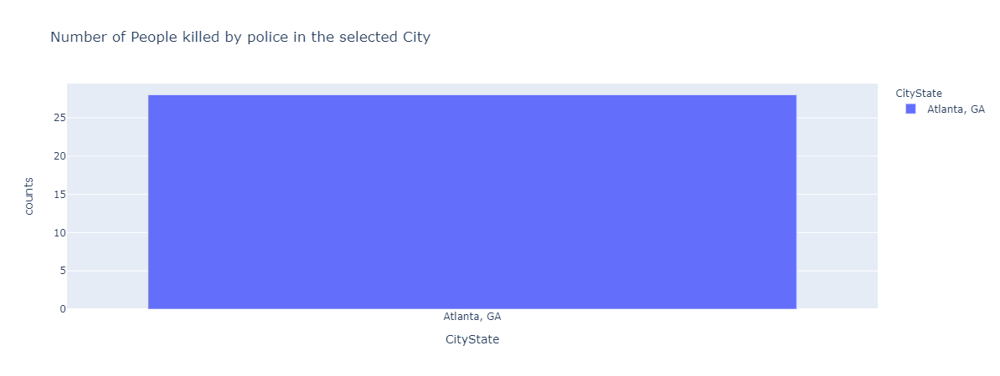

In [18]:
import plotly.express as px
fig = px.bar(test_df, x="CityState", y="counts", title="Number of People killed by police in the selected City", color="CityState")
fig.show()